<span style='color:black'>**Telco Customer Churn**<span>

<span style='color:black'>This work aims to provide a web app to a related department of any business to show them the churn possibility. Based on this information, the department can take action not to lose their customer.</span>

In [1]:
import numpy as np
import pandas as pd

#### Note: Based on the comment (from the instructor) on my previous capstone project presentation, I included two dataset and tried to merge them in terms of the similarities. I found three dataset for this topic and chose two of them. 

In [2]:
df1 = pd.read_csv("churn_100k.csv")
df1.head()

,monthly_minutes,customerServiceCalls,streaming_minutes,TotalBilled,PrevBalance,latePayments,ip_address_asn,phone_area_code,customer_reg_date,email_domain,...,maling_code,paperlessBilling,paymentMethod,EVENT_TIMESTAMP,customerId,billing_address,gender,networkSpeed,senior_citizen,EVENT_LABEL
0,22604.0,2.0,26525.0,285.0,47.0,5.0,16767.0,253.0,2020-04-15,yahoo.com,...,H,No,Mailed Check,2019-11-30 23:48:32,1-136-08562-9,5592 Gill Pine Suite 387,Female,5G,1.0,legit
1,17059.0,2.0,16887.0,201.0,45.0,5.0,53966.0,241.0,2020-04-12,gmail.com,...,V,Yes,Mailed Check,2020-09-27 03:23:42,0-384-11264-1,5806 Kathleen Mount Suite 186,Male,5G,0.0,legit
2,25848.0,2.0,26783.0,264.0,44.0,6.0,19278.0,232.0,2020-02-22,gmail.com,...,R,Yes,Credit Card,2020-01-12 15:18:38,0-08-151665-7,5037 Allen Square Apt. 727,Male,5G,1.0,legit
3,22080.0,3.0,23649.0,274.0,49.0,6.0,16680.0,236.0,2020-08-05,yahoo.com,...,N,No,Mailed Check,2020-10-09 18:07:46,0-02-200816-0,841 Griffin Route Suite 824,Female,5G,0.0,legit
4,23871.0,3.0,7705.0,236.0,61.0,5.0,51308.0,243.0,2019-11-16,gmail.com,...,V,Yes,Electronic Check,2020-10-17 22:27:42,0-87476-135-2,46185 Mejia Manor Apt. 558,Male,4Glte,1.0,legit


In [3]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101000 entries, 0 to 100999
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   monthly_minutes       100978 non-null  float64
 1   customerServiceCalls  100973 non-null  float64
 2   streaming_minutes     100977 non-null  float64
 3   TotalBilled           100964 non-null  float64
 4   PrevBalance           100973 non-null  float64
 5   latePayments          100977 non-null  float64
 6   ip_address_asn        100982 non-null  float64
 7   phone_area_code       100970 non-null  float64
 8   customer_reg_date     100969 non-null  object 
 9   email_domain          100969 non-null  object 
 10  phoneModel            100974 non-null  object 
 11  billing_city          100969 non-null  object 
 12  billing_postal        100970 non-null  float64
 13  billing_state         100971 non-null  object 
 14  partner               100971 non-null  object 
 15  

In [4]:
df1[['EVENT_LABEL', 'EVENT_TIMESTAMP']]

,EVENT_LABEL,EVENT_TIMESTAMP
0,legit,2019-11-30 23:48:32
1,legit,2020-09-27 03:23:42
2,legit,2020-01-12 15:18:38
3,legit,2020-10-09 18:07:46
4,legit,2020-10-17 22:27:42
...,...,...
100995,legit,2019-11-16 12:22:04
100996,legit,2019-11-29 07:47:44
100997,legit,2020-01-03 06:18:32
100998,legit,2020-08-27 00:16:19


In [5]:
df2 = pd.read_csv("Telco_customer_churn.csv")
df2.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,Premium Tech Support,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Customer Status,Churn Score.1,Churn Category
0,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,Yes,0.0,0,20.94,129.09,1,Churned,86,Competitor
1,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,Yes,0.0,0,18.24,169.89,2,Churned,67,Other
2,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,No,Yes,0.0,0,97.20,917.70,3,Churned,86,Other
3,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,0.0,0,136.92,3182.97,3,Churned,84,Other
4,0280-XJGEX,Male,0,No,No,49,Yes,Yes,Fiber optic,No,...,No,Yes,0.0,0,2172.17,7208.47,1,Churned,89,Competitor


In [6]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 52 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   customerID                         7043 non-null   object 
 1   gender                             7043 non-null   object 
 2   SeniorCitizen                      7043 non-null   int64  
 3   Partner                            7043 non-null   object 
 4   Dependents                         7043 non-null   object 
 5   tenure                             7043 non-null   int64  
 6   PhoneService                       7043 non-null   object 
 7   MultipleLines                      7043 non-null   object 
 8   InternetService                    7043 non-null   object 
 9   OnlineSecurity                     7043 non-null   object 
 10  OnlineBackup                       7043 non-null   object 
 11  DeviceProtection                   7043 non-null   objec

In [7]:
df2[['Customer Status', 'Churn']]

,Customer Status,Churn
0,Churned,Yes
1,Churned,Yes
2,Churned,Yes
3,Churned,Yes
4,Churned,Yes
...,...,...
7038,Stayed,No
7039,Stayed,No
7040,Stayed,No
7041,Stayed,No


In [8]:
df3 = pd.read_csv("telco_churn_data.csv")
df3.head()

,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,...,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
0,8779-QRDMV,No,0,1,NaN,No,0.00,No,Yes,Fiber Optic,...,34.023810,-118.156582,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN
1,7495-OOKFY,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,...,34.044271,-118.185237,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN
2,1658-BYGOY,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,...,34.108833,-118.229715,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN
3,4598-XLKNJ,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,...,33.936291,-118.332639,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0
4,4846-WHAFZ,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,...,33.972119,-118.020188,26265,1,2793,Price,Extra data charges,1,0,2.0


In [9]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Referred a Friend                  7043 non-null   object 
 2   Number of Referrals                7043 non-null   int64  
 3   Tenure in Months                   7043 non-null   int64  
 4   Offer                              3166 non-null   object 
 5   Phone Service                      7043 non-null   object 
 6   Avg Monthly Long Distance Charges  7043 non-null   float64
 7   Multiple Lines                     7043 non-null   object 
 8   Internet Service                   7043 non-null   object 
 9   Internet Type                      5517 non-null   object 
 10  Avg Monthly GB Download            7043 non-null   int64  
 11  Online Security                    7043 non-null   objec

In [10]:
df3[['Churn Value']]

,Churn Value
0,1
1,1
2,1
3,1
4,1
...,...
7038,0
7039,0
7040,0
7041,0


In [11]:
df3['Churn'] = df3['Churn Value']

In [12]:
change_columns = ['Churn']

for column in change_columns:
    if column == 'Churn':
        df3[column] = df3[column].map({1: 'Yes', 0: 'No'})
    

In [13]:
df3['Churn'].unique()

array(['Yes', 'No'], dtype=object)

#### Tried to find the max affinity for the two data set I chose

In [14]:
list(set(df1.columns) & set(df2.columns) & set(df3.columns))

[]

In [15]:
list(set(df1.columns) & set(df2.columns))

['OnlineBackup', 'MultipleLines', 'PhoneService', 'gender']

In [16]:
list(set(df1.columns) & set(df3.columns))

[]

In [17]:
list(set(df2.columns) & set(df3.columns))

['Avg Monthly Long Distance Charges',
 'Churn Category',
 'Longitude',
 'Churn',
 'City',
 'Total Long Distance Charges',
 'Number of Referrals',
 'Churn Reason',
 'Dependents',
 'Zip Code',
 'Married',
 'Streaming Music',
 'Total Extra Data Charges',
 'Under 30',
 'Offer',
 'CLTV',
 'Premium Tech Support',
 'Referred a Friend',
 'Unlimited Data',
 'Age',
 'Contract',
 'Avg Monthly GB Download',
 'Total Refunds',
 'Latitude']

In [18]:
# Finding Common columns
b = np.intersect1d(df2.columns, df3.columns)
 
# Printing common columns
print ("Common Columns:",b, len(b))

Common Columns: ['Age' 'Avg Monthly GB Download' 'Avg Monthly Long Distance Charges'
 'CLTV' 'Churn' 'Churn Category' 'Churn Reason' 'City' 'Contract'
 'Dependents' 'Latitude' 'Longitude' 'Married' 'Number of Referrals'
 'Offer' 'Premium Tech Support' 'Referred a Friend' 'Streaming Music'
 'Total Extra Data Charges' 'Total Long Distance Charges' 'Total Refunds'
 'Under 30' 'Unlimited Data' 'Zip Code'] 24


In [19]:
df3_2=df3[b]
df3_2.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,CLTV,Churn,Churn Category,Churn Reason,City,Contract,Dependents,...,Offer,Premium Tech Support,Referred a Friend,Streaming Music,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Under 30,Unlimited Data,Zip Code
0,78,9,0.00,5433,Yes,Competitor,Competitor offered more data,Los Angeles,Month-to-Month,No,...,NaN,No,No,No,0.0,0.00,0.00,No,No,90022
1,74,19,48.85,5302,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-Month,Yes,...,Offer E,No,Yes,No,120.0,390.80,0.00,No,No,90063
2,71,57,11.33,3179,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-Month,Yes,...,Offer D,No,No,Yes,0.0,203.94,45.61,No,Yes,90065
3,78,13,19.76,5337,Yes,Dissatisfaction,Limited range of services,Inglewood,Month-to-Month,Yes,...,Offer C,No,Yes,No,327.0,494.00,13.43,No,No,90303
4,80,15,6.33,2793,Yes,Price,Extra data charges,Whittier,Month-to-Month,Yes,...,Offer C,No,Yes,No,430.0,234.21,0.00,No,No,90602


In [20]:
df3_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                7043 non-null   int64  
 1   Avg Monthly GB Download            7043 non-null   int64  
 2   Avg Monthly Long Distance Charges  7043 non-null   float64
 3   CLTV                               7043 non-null   int64  
 4   Churn                              7043 non-null   object 
 5   Churn Category                     1869 non-null   object 
 6   Churn Reason                       1869 non-null   object 
 7   City                               7043 non-null   object 
 8   Contract                           7043 non-null   object 
 9   Dependents                         7043 non-null   object 
 10  Latitude                           7043 non-null   float64
 11  Longitude                          7043 non-null   float

In [21]:
df2_3=df2[b]
df2_3.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,CLTV,Churn,Churn Category,Churn Reason,City,Contract,Dependents,...,Offer,Premium Tech Support,Referred a Friend,Streaming Music,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Under 30,Unlimited Data,Zip Code
0,37,21,10.47,3239,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0,20.94,0.0,No,Yes,90003
1,19,51,9.12,2701,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0,18.24,0.0,Yes,Yes,90005
2,31,26,12.15,5372,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0,97.20,0.0,No,Yes,90006
3,23,47,4.89,5003,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,Offer C,Yes,No,Yes,0,136.92,0.0,Yes,Yes,90010
4,38,11,44.33,5340,Yes,Competitor,Competitor had better devices,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0,2172.17,0.0,No,Yes,90015


In [22]:
df2_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                7043 non-null   int64  
 1   Avg Monthly GB Download            7043 non-null   int64  
 2   Avg Monthly Long Distance Charges  7043 non-null   float64
 3   CLTV                               7043 non-null   int64  
 4   Churn                              7043 non-null   object 
 5   Churn Category                     7043 non-null   object 
 6   Churn Reason                       1869 non-null   object 
 7   City                               7043 non-null   object 
 8   Contract                           7043 non-null   object 
 9   Dependents                         7043 non-null   object 
 10  Latitude                           7043 non-null   float64
 11  Longitude                          7043 non-null   float

In [23]:
df_telco=pd.concat([df2_3, df3_2])
df_telco

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,CLTV,Churn,Churn Category,Churn Reason,City,Contract,Dependents,...,Offer,Premium Tech Support,Referred a Friend,Streaming Music,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Under 30,Unlimited Data,Zip Code
0,37,21,10.47,3239,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0.0,20.94,0.00,No,Yes,90003
1,19,51,9.12,2701,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0.0,18.24,0.00,Yes,Yes,90005
2,31,26,12.15,5372,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0.0,97.20,0.00,No,Yes,90006
3,23,47,4.89,5003,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,Offer C,Yes,No,Yes,0.0,136.92,0.00,Yes,Yes,90010
4,38,11,44.33,5340,Yes,Competitor,Competitor had better devices,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0.0,2172.17,0.00,No,Yes,90015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,30,0,22.77,5306,No,NaN,NaN,Landers,Two Year,No,...,NaN,No,No,No,0.0,1639.44,19.31,No,No,92285
7039,38,24,36.05,2140,No,NaN,NaN,Adelanto,One Year,Yes,...,Offer C,Yes,Yes,Yes,0.0,865.20,48.23,No,Yes,92301
7040,30,59,29.66,5560,No,NaN,NaN,Amboy,One Year,Yes,...,NaN,No,Yes,Yes,4344.0,2135.52,45.38,No,No,92304
7041,32,17,0.00,2793,No,NaN,NaN,Angelus Oaks,Month-to-Month,Yes,...,NaN,No,Yes,No,0.0,0.00,27.24,No,Yes,92305


In [24]:
df_telco.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14086 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                14086 non-null  int64  
 1   Avg Monthly GB Download            14086 non-null  int64  
 2   Avg Monthly Long Distance Charges  14086 non-null  float64
 3   CLTV                               14086 non-null  int64  
 4   Churn                              14086 non-null  object 
 5   Churn Category                     8912 non-null   object 
 6   Churn Reason                       3738 non-null   object 
 7   City                               14086 non-null  object 
 8   Contract                           14086 non-null  object 
 9   Dependents                         14086 non-null  object 
 10  Latitude                           14086 non-null  float64
 11  Longitude                          14086 non-null  float64
 

In [25]:
df_telco.shape

(14086, 24)

In [26]:
df_telco.isnull().any()

Age                                  False
Avg Monthly GB Download              False
Avg Monthly Long Distance Charges    False
CLTV                                 False
Churn                                False
Churn Category                        True
Churn Reason                          True
City                                 False
Contract                             False
Dependents                           False
Latitude                             False
Longitude                            False
Married                              False
Number of Referrals                  False
Offer                                 True
Premium Tech Support                 False
Referred a Friend                    False
Streaming Music                      False
Total Extra Data Charges             False
Total Long Distance Charges          False
Total Refunds                        False
Under 30                             False
Unlimited Data                       False
Zip Code   

In [27]:
# check unique values of each column
for column in df_telco.columns:
    print('Column: {} - Unique Values: {}'.format(column, df_telco[column].unique()))

Column: Age - Unique Values: [37 19 31 23 38 21 78 29 61 27 20 56 51 48 32 34 74 71 41 30 26 80 62 72
 64 45 76 53 63 42 66 24 70 77 54 39 43 50 22 40 65 47 67 68 60 52 69 55
 79 59 49 58 25 28 33 44 75 57 73 46 36 35]
Column: Avg Monthly GB Download - Unique Values: [21 51 26 47 11 69  8  0 16 58 41 28 18 19 20 17 52 29 57 53 56 12 27 14
 30 71 48 22  3 24 73 76  9  7 15  2 10  5 59 13 25 23 82  4 42  6 39 85
 46 75 33 32 31 64 45 63 62 78 80 84 65 90 43 94]
Column: Avg Monthly Long Distance Charges - Unique Values: [10.47  9.12 12.15 ... 44.98  8.62  9.08]
Column: CLTV - Unique Values: [3239 2701 5372 ... 2770 4645 5553]
Column: Churn - Unique Values: ['Yes' 'No']
Column: Churn Category - Unique Values: ['Competitor' 'Other' 'Price' 'Dissatisfaction' 'Attitude' '0' nan]
Column: Churn Reason - Unique Values: ['Competitor made better offer' 'Moved' 'Competitor had better devices'
 'Competitor offered higher download speeds'
 'Competitor offered more data' 'Price too high' 'Product diss

In [28]:
df_telco.columns

Index(['Age', 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges',
       'CLTV', 'Churn', 'Churn Category', 'Churn Reason', 'City', 'Contract',
       'Dependents', 'Latitude', 'Longitude', 'Married', 'Number of Referrals',
       'Offer', 'Premium Tech Support', 'Referred a Friend', 'Streaming Music',
       'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Refunds', 'Under 30', 'Unlimited Data', 'Zip Code'],
      dtype='object')

In [29]:
num_cols = ['Age', 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges',
       'CLTV', 'Latitude', 'Longitude','Number of Referrals', 'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Refunds', 'Zip Code']
num_cols

['Age',
 'Avg Monthly GB Download',
 'Avg Monthly Long Distance Charges',
 'CLTV',
 'Latitude',
 'Longitude',
 'Number of Referrals',
 'Total Extra Data Charges',
 'Total Long Distance Charges',
 'Total Refunds',
 'Zip Code']

In [30]:
cat_cols = ['Churn', 'Churn Category', 'Churn Reason', 'City', 'Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend', 'Streaming Music', 'Under 30 ', 'Unlimited Data']
cat_cols

['Churn',
 'Churn Category',
 'Churn Reason',
 'City',
 'Contract',
 'Dependents',
 'Offer',
 'Married',
 'Premium Tech Support',
 'Referred a Friend',
 'Streaming Music',
 'Under 30 ',
 'Unlimited Data']

In [31]:
### To check which features are more effective for determination of churn 

In [32]:
# import matplotlib.pyplot as plt 

In [33]:
# df_telco.iloc[:, 1]

In [34]:
# fig = plt.figure(figsize = (10, 5))
 
# # creating the bar plot
# plt.bar(df_telco['Churn'], df_telco['CLTV'], color ='maroon', 
#         width = 0.4)
 
# plt.xlabel("Courses offered")
# plt.ylabel("No. of students enrolled")
# plt.title("Students enrolled in different courses")
# plt.show()

In [35]:
# import math

# def histogram_plots(columns_to_plot, super_title):
#     '''
#      Prints a histogram for each independent variable of the list columns_to_plot.
#             Parameters:
#                     columns_to_plot (list of string): Names of the variables to plot
#                     super_title (string): Super title of the visualization
#             Returns:
#                     None
#     '''
#     # set number of rows and number of columns
#     number_of_columns = 2
#     number_of_rows = math.ceil(len(columns_to_plot)/2)

#     # create a figure
#     fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
#     fig.suptitle(super_title, fontsize=22,  y=.95)
 

#     # loop to each demographic column name to create a subplot
#     for index, column in enumerate(columns_to_plot, 1):

#         # create the subplot
#         ax = fig.add_subplot(number_of_rows, number_of_columns, index)

#         # histograms for each class (normalized histogram)
#         df_telco[df_telco['Churn']=='No'][column].plot(kind='hist', ax=ax, density=True, 
#                                                        alpha=0.5, color='springgreen', label='No')
#         df_telco[df_telco['Churn']=='Yes'][column].plot(kind='hist', ax=ax, density=True,
#                                                         alpha=0.5, color='salmon', label='Yes')
        
#         # set the legend in the upper right corner
#         ax.legend(loc="upper right", bbox_to_anchor=(0.5, 0.5, 0.5, 0.5),
#                   title='Churn', fancybox=True)

#         # set title and labels
#         ax.set_title('Distribution of ' + column + ' by churn',
#                      fontsize=16, loc='left')

#         ax.tick_params(rotation='auto')

#         # eliminate the frame from the plot
#         spine_names = ('top', 'right', 'bottom', 'left')
#         for spine_name in spine_names:
#             ax.spines[spine_name].set_visible(False)
            


In [36]:
# num_cols

In [37]:
# # customer account column names
# account_columns_numeric = ['Number of Referrals']
# # histogram of costumer account columns 
# histogram_plots(account_columns_numeric, 'Age')

In [38]:
# import math

# def percentage_stacked_plot(columns_to_plot, super_title):
    
#     '''
#     Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
#             Parameters:
#                     columns_to_plot (list of string): Names of the variables to plot
#                     super_title (string): Super title of the visualization
#             Returns:
#                     None
#     '''
    
#     number_of_columns = 2
#     number_of_rows = math.ceil(len(columns_to_plot)/2)

#     # create a figure
#     fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
#     fig.suptitle(super_title, fontsize=22,  y=.95)
 

#     # loop to each column name to create a subplot
#     for index, column in enumerate(columns_to_plot, 1):

#         # create the subplot
#         ax = fig.add_subplot(number_of_rows, number_of_columns, index)

#         # calculate the percentage of observations of the response variable for each group of the independent variable
#         # 100% stacked bar plot
#         prop_by_independent = pd.crosstab(df_telco[column], df_telco['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

#         prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
#                                  rot=0, color=['springgreen','salmon'])

#         # set the legend in the upper right corner
#         ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
#                   title='Churn', fancybox=True)

#         # set title and labels
#         ax.set_title('Proportion of observations by ' + column,
#                      fontsize=16, loc='left')

#         ax.tick_params(rotation='auto')

#         # eliminate the frame from the plot
#         spine_names = ('top', 'right', 'bottom', 'left')
#         for spine_name in spine_names:
#             ax.spines[spine_name].set_visible(False)

In [39]:
# # demographic column names
# demographic_columns = ['Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend']

# #['Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend']


# # stacked plot of demographic columns
# percentage_stacked_plot(demographic_columns, 'Demographic Information')

In [40]:
# Preferrred ones (based on the investigation)

cat_cols2 = ['Churn', 'Contract', 'Dependents','Married','Premium Tech Support', 'Referred a Friend']
cat_cols2

['Churn',
 'Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [41]:
# Preferrred ones (based on the investigation)

num_cols2 = ['Age','Number of Referrals']
num_cols2

['Age', 'Number of Referrals']

In [42]:
new_cols = num_cols2 + cat_cols2
new_cols

['Age',
 'Number of Referrals',
 'Churn',
 'Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [43]:
df_end = df_telco[new_cols]
df_end.tail()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
7038,30,0,No,Two Year,No,No,No,No
7039,38,1,No,One Year,Yes,Yes,Yes,Yes
7040,30,4,No,One Year,Yes,Yes,No,Yes
7041,32,1,No,Month-to-Month,Yes,Yes,No,Yes
7042,44,0,No,Two Year,No,No,Yes,No


In [44]:
df_end.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14086 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Age                   14086 non-null  int64 
 1   Number of Referrals   14086 non-null  int64 
 2   Churn                 14086 non-null  object
 3   Contract              14086 non-null  object
 4   Dependents            14086 non-null  object
 5   Married               14086 non-null  object
 6   Premium Tech Support  14086 non-null  object
 7   Referred a Friend     14086 non-null  object
dtypes: int64(2), object(6)
memory usage: 990.4+ KB


In [45]:
df_end['Contract'].unique()

array(['Month-to-month', 'Two year', 'One year', 'Month-to-Month',
       'One Year', 'Two Year'], dtype=object)

In [46]:
df_end['Contract'] = df_end['Contract'].replace(['Month-to-Month'], 'Month-to-month')
df_end['Contract'] = df_end['Contract'].replace(['One Year'], 'One year')
df_end['Contract'] = df_end['Contract'].replace(['Two Year'], 'Two year')

<ipython-input-46-b5091823ce06>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_end['Contract'] = df_end['Contract'].replace(['Month-to-Month'], 'Month-to-month')
<ipython-input-46-b5091823ce06>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_end['Contract'] = df_end['Contract'].replace(['One Year'], 'One year')
<ipython-input-46-b5091823ce06>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [47]:
df_end['Contract'].unique()

array(['Month-to-month', 'Two year', 'One year'], dtype=object)

In [48]:
# df_end.to_csv('C:/Users/esennik/Desktop/Streamlit2/df_end.csv', index=False)

In [49]:
# check unique values of each column
for column in df_end.columns:
    print('Column: {} - Unique Values: {}'.format(column, df_end[column].unique()))

Column: Age - Unique Values: [37 19 31 23 38 21 78 29 61 27 20 56 51 48 32 34 74 71 41 30 26 80 62 72
 64 45 76 53 63 42 66 24 70 77 54 39 43 50 22 40 65 47 67 68 60 52 69 55
 79 59 49 58 25 28 33 44 75 57 73 46 36 35]
Column: Number of Referrals - Unique Values: [ 0  6  1  4  5  2  3  7  9  8 10 11]
Column: Churn - Unique Values: ['Yes' 'No']
Column: Contract - Unique Values: ['Month-to-month' 'Two year' 'One year']
Column: Dependents - Unique Values: ['No' 'Yes']
Column: Married - Unique Values: ['No' 'Yes']
Column: Premium Tech Support - Unique Values: ['No' 'Yes']
Column: Referred a Friend - Unique Values: ['No' 'Yes']


In [50]:
from sklearn.preprocessing import LabelEncoder
le_con = LabelEncoder()
le_dep = LabelEncoder()
le_mar = LabelEncoder()
le_pre = LabelEncoder()
le_ref = LabelEncoder()

In [51]:
df_final_transformed = df_end.copy()

df_final_transformed['Contract'] = le_con.fit_transform(df_final_transformed['Contract'])
df_final_transformed['Dependents'] = le_dep.fit_transform(df_final_transformed['Dependents'])
# df_final_transformed['Offer'] = le_cat.fit_transform(df_final_transformed['Offer'])
df_final_transformed['Married'] = le_mar.fit_transform(df_final_transformed['Married'])
df_final_transformed['Premium Tech Support'] = le_pre.fit_transform(df_final_transformed['Premium Tech Support'])
df_final_transformed['Referred a Friend'] = le_ref.fit_transform(df_final_transformed['Referred a Friend'])

df_final_transformed.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,Yes,0,0,0,0,0
1,19,0,Yes,0,0,0,0,0
2,31,0,Yes,0,0,0,0,0
3,23,0,Yes,0,0,1,1,0
4,38,0,Yes,0,0,0,0,0


In [52]:
df2_3['Referred a Friend'].unique()

array(['No', 'Yes'], dtype=object)

In [53]:
df3_2['Referred a Friend'].unique()

array(['No', 'Yes'], dtype=object)

In [54]:
df_end['Contract'].unique()

array(['Month-to-month', 'Two year', 'One year'], dtype=object)

In [55]:
df_final_transformed['Contract'].unique()

array([0, 2, 1])

In [56]:
import numpy as np

In [57]:
np.version

<module 'numpy.version' from 'C:\\Users\\esennik\\AppData\\Roaming\\Python\\Python38\\site-packages\\numpy\\version.py'>

In [58]:
# select independent variables
X = df_final_transformed.drop(columns='Churn')

# select dependent variables
y = df_final_transformed.loc[:, 'Churn']

In [59]:
X.head()

,Age,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,0,0,0,0,0
1,19,0,0,0,0,0,0
2,31,0,0,0,0,0,0
3,23,0,0,0,1,1,0
4,38,0,0,0,0,0,0


In [60]:
y.head()

0    Yes
1    Yes
2    Yes
3    Yes
4    Yes
Name: Churn, dtype: object

In [61]:
# from sklearn.model_selection import train_test_split

# # split the data in training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
#                                                     random_state=40, shuffle=True)

In [62]:
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [63]:
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()


In [64]:
from sklearn.metrics import accuracy_score

###
# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # fit the model with the training data
    model.fit(X, y)
    # make predictions with the testing data
    predictions = model.predict(X)
    # calculate accuracy 
    accuracy = accuracy_score(y, predictions)
    # append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

Classifier: dummy_classifier, Accuracy: 0.7346301292063041)
Classifier: k_nearest_neighbors, Accuracy: 0.7875905154053671)
Classifier: support_vector_machines, Accuracy: 0.756282834019594)
Classifier: random_forest, Accuracy: 0.8343035638222348)
Classifier: gradient_boosting, Accuracy: 0.7939798381371574)


In [65]:
###
# RF
rf_model = RandomForestClassifier()
# fitting the model for random search 
mdl = rf_model.fit(X, y)
###

predictions = mdl.predict(X)
# calculate accuracy 
accuracy = accuracy_score(y, predictions)
accuracy

###

0.8343745562970325

In [78]:
# from sklearn.metrics import mutual_info_score
# # function that computes the mutual infomation score between a categorical serie and the column Churn
# def compute_mutual_information(categorical_serie):
#     return mutual_info_score(categorical_serie, df_telco.Churn)

# # select categorial variables excluding the response variable 
# categorical_variables = df_end.select_dtypes(include=object).drop('Churn', axis=1)

# # compute the mutual information score between each categorical variable and the target
# feature_importance = categorical_variables.apply(compute_mutual_information).sort_values(ascending=False)

# # visualize feature importance
# print(feature_importance)


In [79]:
# df_telco.info()

In [80]:
# df_telco1 = df_telco.dropna()
# df_telco1.info()

In [81]:
# from sklearn.metrics import mutual_info_score
# # function that computes the mutual infomation score between a categorical serie and the column Churn
# def compute_mutual_information(categorical_serie):
#     return mutual_info_score(categorical_serie, df_telco1.Churn)

# # select categorial variables excluding the response variable 
# categorical_variables = df_telco1.select_dtypes(include=object).drop('Churn', axis=1)

# # compute the mutual information score between each categorical variable and the target
# feature_importance = categorical_variables.apply(compute_mutual_information).sort_values(ascending=False)

# # visualize feature importance
# print(feature_importance)


In [66]:
# from sklearn.model_selection import GridSearchCV

# # define the parameter grid
# grid_parameters = {'n_estimators': [10, 25, 50, 100, 150],
#                    'max_depth': [5, 10, None],
#                    'max_features': [None, 'auto', 'sqrt', 'log2'],
#                    'bootstrap': [True, False],
#                    'min_samples_split': [2, 5, 10, 20]}


# # define the RandomizedSearchCV class for trying different parameter combinations
# grid_search_rf = GridSearchCV(estimator=RandomForestClassifier(),
#                                    param_grid=grid_parameters,
#                                    cv=5,
#                                    n_jobs=-1)

# # fitting the model for random search 
# grid_search_rf.fit(X, y)

# # print best parameter after tuning
# print(grid_search_rf.best_params_)

In [67]:
# predictions = grid_search_rf.best_estimator_.predict(X)
# # calculate accuracy 
# accuracy = accuracy_score(y, predictions)
# # append the model name and the accuracy to the lists
# results.append(accuracy)
# names.append(name)
# # print classifier accuracy
# print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

In [68]:
import joblib

In [71]:
# save the model to disk
joblib.dump(rf_model, 'rf_model.sav')

['rf_model.sav']

In [86]:
###
# RF model
rf_model = RandomForestClassifier()
# fitting the model for random search 
mdl = rf_model.fit(X, y)
###

predictions = mdl.predict(X)
# calculate accuracy 
accuracy = accuracy_score(y, predictions)
accuracy

###

0.8343035638222348

In [87]:
from sklearn.metrics import confusion_matrix
# construct the confusion matrix
confusion_matrix = confusion_matrix(y, predictions)

# visualize the confusion matrix
confusion_matrix

array([[9432,  916],
       [1418, 2320]], dtype=int64)

In [88]:
from sklearn.metrics import classification_report
print(classification_report(y, predictions))

              precision    recall  f1-score   support

          No       0.87      0.91      0.89     10348
         Yes       0.72      0.62      0.67      3738

    accuracy                           0.83     14086
   macro avg       0.79      0.77      0.78     14086
weighted avg       0.83      0.83      0.83     14086



In [89]:
accuracy_score(y, predictions)

0.8343035638222348

In [61]:
# from sklearn.metrics import accuracy_score

# ###
# # test the accuracy of each model using default hyperparameters
# results = []
# names = []
# scoring = 'accuracy'
# for name, model in models:
#     # fit the model with the training data
#     model.fit(X_train, y_train)
#     # make predictions with the testing data
#     predictions = model.predict(X_test)
#     # calculate accuracy 
#     accuracy = accuracy_score(y_test, predictions)
#     # append the model name and the accuracy to the lists
#     results.append(accuracy)
#     names.append(name)
#     # print classifier accuracy
#     print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

# ###

In [62]:
# from sklearn.metrics import f1_score

# # test the accuracy of each model using default hyperparameters
# results = []
# names = []
# scoring = 'f1-score'
# for name, model in models:
#     # fit the model with the training data
#     model.fit(X_train, y_train).predict(X_test)
#     # make predictions with the testing data
#     predictions = model.predict(X_test)
#     # calculate accuracy 
#     score = f1_score(y_test, predictions, pos_label='No')
#     # append the model name and the accuracy to the lists
#     results.append(score)
#     names.append(name)
#     # print classifier accuracy
#     print('Classifier: {}, f1_score: {})'.format(name, score))

In [63]:
# ###
# # GRAD
# grad_model = GradientBoostingClassifier()
# # fitting the model for random search 
# mdl = grad_model.fit(X_train, y_train)
# ###

# predictions = mdl.predict(X_test)
# # calculate accuracy 
# accuracy = accuracy_score(y_test, predictions)
# accuracy

# ###

In [64]:
# ###
# # GRAD
# grad_model = GradientBoostingClassifier()
# # fitting the model for random search 
# mdl = grad_model.fit(X_train, y_train)
# ###

# predictions = mdl.predict(X_test)
# # calculate accuracy 
# score = f1_score(y_test, predictions, pos_label='No')
# score

# ###

In [72]:
import joblib
# save the model to disk

data = {'model':rf_model, 'le_con': le_con, 'le_dep': le_dep, 'le_mar': le_mar, 'le_pre': le_pre, 'le_ref': le_ref}
with open('rf_model.sav', 'wb') as file:
    joblib.dump(data, file)



In [73]:
with open('rf_model.sav', 'rb') as file:
    data = joblib.load(file)
    
rf_model = data['model']
le_con = data['le_con']
le_dep = data['le_dep']
le_mar = data['le_mar']
le_pre = data['le_pre']
le_ref = data['le_ref']

In [90]:
import pickle

data = {'model':rf_model, 'le_con': le_con, 'le_dep': le_dep, 'le_mar': le_mar, 'le_pre': le_pre, 'le_ref': le_ref}
with open('rf_model_steps.pkl', 'wb') as file:
    pickle.dump(data, file)

In [91]:
with open('rf_model_steps.pkl', 'rb') as file:
    data = pickle.load(file)
    
rf_model = data['model']
le_con = data['le_con']
le_dep = data['le_dep']
le_mar = data['le_mar']
le_pre = data['le_pre']
le_ref = data['le_ref']

In [92]:
df_end.tail(5)

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
7038,30,0,No,Two year,No,No,No,No
7039,38,1,No,One year,Yes,Yes,Yes,Yes
7040,30,4,No,One year,Yes,Yes,No,Yes
7041,32,1,No,Month-to-month,Yes,Yes,No,Yes
7042,44,0,No,Two year,No,No,Yes,No


In [93]:
df_final_transformed.tail(5)

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
7038,30,0,No,2,0,0,0,0
7039,38,1,No,1,1,1,1,1
7040,30,4,No,1,1,1,0,1
7041,32,1,No,0,1,1,0,1
7042,44,0,No,2,0,0,1,0


In [94]:
#['Age', 'Number of Referrals', Contract', 'Dependents', 'Married','Premium Tech Support', 'Referred a Friend']

Xtest = np.array([[44, 0, 'Two year', 'No', 'No', 'Yes', 'No']])
Xtest

array([['44', '0', 'Two year', 'No', 'No', 'Yes', 'No']], dtype='<U11')

In [95]:
Xtest[:, 2] = le_con.transform(Xtest[:, 2])
Xtest[:, 3] = le_dep.transform(Xtest[:, 3])
Xtest[:, 4] = le_mar.transform(Xtest[:, 4])
Xtest[:, 5] = le_pre.transform(Xtest[:, 5])
Xtest[:, 6] = le_ref.transform(Xtest[:, 6])
# Xtest[:, 7] = le_cat.fit_transform(Xtest[:, 7])

Xtest = Xtest.astype(float)
Xtest

array([[44.,  0.,  2.,  0.,  0.,  1.,  0.]])

In [99]:
y_pred = mdl.predict(Xtest)
y_pred

C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array(['No'], dtype=object)

In [97]:
accuracy = accuracy_score(mdl.predict(Xtest), y_pred)
# append the model name and the accuracy to the lists
accuracy
# names.append(name)
# # print classifier accuracy
# print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


1.0

In [302]:
# select independent variables
# X = df_end.drop(columns='Churn')
X = df_final_transformed.drop('Churn', axis=1)

# select dependent variables
# y = df_end.loc[:, 'Churn']
y = df_final_transformed['Churn']

In [303]:
from sklearn.model_selection import train_test_split

# split the data in training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=40, shuffle=True)

In [305]:
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()


In [308]:
from sklearn.metrics import f1_score

# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'f1-score'
for name, model in models:
    # fit the model with the training data
    model.fit(X_train, y_train).predict(X_test)
    # make predictions with the testing data
    predictions = model.predict(X_test)
    # calculate accuracy 
    score = f1_score(y_test, predictions, pos_label='No')
    # append the model name and the accuracy to the lists
    results.append(score)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, f1_score: {})'.format(name, score))

Classifier: dummy_classifier, f1_score: 0.847443762781186)
Classifier: k_nearest_neighbors, f1_score: 0.8403788403788403)
Classifier: support_vector_machines, f1_score: 0.847443762781186)
Classifier: random_forest, f1_score: 0.918179674605046)
Classifier: gradient_boosting, f1_score: 0.8862526168876483)


In [309]:
import pickle

data = {'model':rf_model, 'le_cat': le_cat}
with open('capstone_steps_f1score.pkl', 'wb') as file:
    pickle.dump(data, file)

In [310]:
with open('capstone_steps_f1score.pkl', 'rb') as file:
    data = pickle.load(file)
    
rf_model = data['model']
le_cat = data['le_cat']

In [311]:
#['City', 'Contract', 'Dependents', 'Offer', 'Married',...
# 'Premium Tech Support', 'Referred a Friend', 'Age',...
# 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges', 'Number of Referrals']

Xtest = np.array([['Los Angeles', 'Month-to-month', 'No', 'None', 'No', 'No', 'No', 37, 21, 10.47, 0]])
Xtest

array([['Los Angeles', 'Month-to-month', 'No', 'None', 'No', 'No', 'No',
        '37', '21', '10.47', '0']], dtype='<U14')

In [312]:
le_contract = LabelEncoder()
Xtest[:, 0] = le_contract.fit_transform(Xtest[:, 0])
Xtest[:, 1] = le_contract.fit_transform(Xtest[:, 1])
Xtest[:, 2] = le_contract.fit_transform(Xtest[:, 2])
Xtest[:, 3] = le_contract.fit_transform(Xtest[:, 3])
Xtest[:, 4] = le_contract.fit_transform(Xtest[:, 4])
Xtest[:, 5] = le_contract.fit_transform(Xtest[:, 5])
Xtest[:, 6] = le_contract.fit_transform(Xtest[:, 6])

Xtest = Xtest.astype(float)
Xtest

# # min-max normalization (numeric variables)
# min_max_columns = Xtest[7, :]

# # scale numerical variables using min max scaler
# for column in min_max_columns:
#         # minimum value of the column
#         min_column = Xtest[column].min()
#         # maximum value of the column
#         max_column = Xtest[column].max()
#         # min max scaler
#         Xtest[column] = (Xtest[column] - min_column) / (max_column - min_column)   

array([[ 0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  , 37.  , 21.  ,
        10.47,  0.  ]])

In [313]:
y_pred = rf_model.predict(Xtest)
y_pred

array(['No'], dtype=object)

In [ ]:
#['City', 'Contract', 'Dependents', 'Offer', 'Married',...
# 'Premium Tech Support', 'Referred a Friend', 'Age',...
# 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges', 'Number of Referrals']

In [326]:
len(df_final['Number of Referrals'].unique())

12

In [ ]:
#[ 'Contract', 'Dependents', 'Offer','Married',...
# 'Premium Tech Support', 'Referred a Friend', 'Age',...
#'Number of Referrals']

In [704]:
# last_col = ['Churn','Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend']
last_col = ['Age', 'Churn','Number of Referrals', 'Contract', 'Dependents', 'Married', 'Premium Tech Support', 'Referred a Friend']
last_col

['Age',
 'Churn',
 'Number of Referrals',
 'Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [705]:
df_last = df_telco[last_col]
df_last

,Age,Churn,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,Yes,0,Month-to-month,No,No,No,No
1,19,Yes,0,Month-to-month,No,No,No,No
2,31,Yes,0,Month-to-month,No,No,No,No
3,23,Yes,0,Month-to-month,No,Yes,Yes,No
4,38,Yes,0,Month-to-month,No,No,No,No
...,...,...,...,...,...,...,...,...
7038,30,No,0,Two Year,No,No,No,No
7039,38,No,1,One Year,Yes,Yes,Yes,Yes
7040,30,No,4,One Year,Yes,Yes,No,Yes
7041,32,No,1,Month-to-Month,Yes,Yes,No,Yes


In [706]:
df_last.to_csv('C:/Users/esennik/Desktop/Streamlit2/df_last.csv', index=False)

In [702]:
df_last.isnull().any()

Age                     False
Churn                   False
Contract                False
Dependents              False
Married                 False
Premium Tech Support    False
Referred a Friend       False
dtype: bool

In [703]:
df_last.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14086 entries, 0 to 7042
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Age                   14086 non-null  int64 
 1   Churn                 14086 non-null  object
 2   Contract              14086 non-null  object
 3   Dependents            14086 non-null  object
 4   Married               14086 non-null  object
 5   Premium Tech Support  14086 non-null  object
 6   Referred a Friend     14086 non-null  object
dtypes: int64(1), object(6)
memory usage: 880.4+ KB


In [106]:
from sklearn.preprocessing import LabelEncoder
le_cat = LabelEncoder()

In [108]:
df_last_transformed = df_last.copy()

df_last_transformed['Contract'] = le_cat.fit_transform(df_last_transformed['Contract'])
df_last_transformed['Dependents'] = le_cat.fit_transform(df_last_transformed['Dependents'])
df_last_transformed['Married'] = le_cat.fit_transform(df_last_transformed['Married'])
df_last_transformed['Premium Tech Support'] = le_cat.fit_transform(df_last_transformed['Premium Tech Support'])
df_last_transformed['Referred a Friend'] = le_cat.fit_transform(df_last_transformed['Referred a Friend'])

df_last_transformed.head()

,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,Yes,1,0,0,0,0
1,Yes,1,0,0,0,0
2,Yes,1,0,0,0,0
3,Yes,1,0,1,1,0
4,Yes,1,0,0,0,0


In [109]:
# select independent variables
X = df_last_transformed.drop(columns='Churn')

# select dependent variables
y = df_last_transformed.loc[:, 'Churn']

In [119]:
!pip install numpy==1.24 --user
import sklearn
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

AttributeError: module 'numpy' has no attribute 'float'.
`np.float` was a deprecated alias for the builtin `float`. To avoid this error in existing code, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

In [118]:
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()


NameError: name 'KNeighborsClassifier' is not defined

In [105]:
from sklearn.model_selection import train_test_split

# split the data in training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=40, shuffle=True)

NameError: name 'X' is not defined

In [288]:
num_cols

['Age', 'Number of Referrals']

In [290]:
for index, column in enumerate(num_cols, 1):
    print(index)

1
2


In [297]:
import math
#**************
def percentage_stacked_plot(columns_to_plot, super_title):
    
    '''
    Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
            Parameters:
                    columns_to_plot (list of string): Names of the variables to plot
                    super_title (string): Super title of the visualization
            Returns:
                    None
    '''
    
    number_of_columns = 2
    number_of_rows = math.ceil(len(columns_to_plot)/2)

    # create a figure
    fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
    fig.suptitle(super_title, fontsize=22,  y=.95)
 

    # loop to each column name to create a subplot
    for index, column in enumerate(columns_to_plot, 1):

        # create the subplot
        ax = fig.add_subplot(number_of_rows, number_of_columns, index)

        # calculate the percentage of observations of the response variable for each group of the independent variable
        # 100% stacked bar plot
        prop_by_independent = pd.crosstab(df_end[column], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

        prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
                                 rot=0, color=['springgreen','salmon'])

        # set the legend in the upper right corner
        ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
                  title='Churn', fancybox=True)

        # set title and labels
        ax.set_title('Proportion of observations by ' + column,
                     fontsize=16, loc='left')

        ax.tick_params(rotation='auto')

        # eliminate the frame from the plot
        spine_names = ('top', 'right', 'bottom', 'left')
        for spine_name in spine_names:
            ax.spines[spine_name].set_visible(False)



In [298]:
df_end.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,Yes,Month-to-month,No,No,No,No
1,19,0,Yes,Month-to-month,No,No,No,No
2,31,0,Yes,Month-to-month,No,No,No,No
3,23,0,Yes,Month-to-month,No,Yes,Yes,No
4,38,0,Yes,Month-to-month,No,No,No,No


In [299]:
df_end.columns

Index(['Age', 'Number of Referrals', 'Churn', 'Contract', 'Dependents',
       'Married', 'Premium Tech Support', 'Referred a Friend'],
      dtype='object')

In [300]:
num_cols = ['Age', 'Number of Referrals']
cat_cols = ['Contract', 'Dependents', 'Married', 'Premium Tech Support', 'Referred a Friend']

In [312]:
# import matplotlib.pyplot as plt
# # stacked plot of categorical columns
# percentage_stacked_plot(num_cols, 'Some Information')

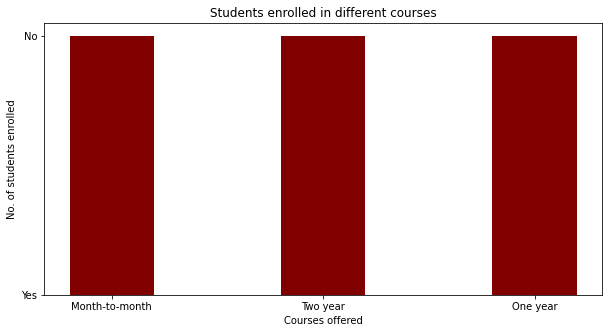

In [306]:
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(df_end['Contract'], df_end['Churn'], color ='maroon', 
        width = 0.4)
 
plt.xlabel("Courses offered")
plt.ylabel("No. of students enrolled")
plt.title("Students enrolled in different courses")
plt.show()

In [309]:
prop_by_independent = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
prop_by_independent

Churn,No,Yes
Age,,
19,85.826772,14.173228
20,76.377953,23.622047
21,74.285714,25.714286
22,79.230769,20.769231
23,80.136986,19.863014
...,...,...
76,57.971014,42.028986
77,59.722222,40.277778
78,52.380952,47.619048


In [340]:
type(prop_by_independent)

pandas.core.frame.DataFrame

In [343]:
prop_by_independent.columns

Index(['No', 'Yes'], dtype='object', name='Churn')

In [344]:
prop_by_independent.index

Index([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79, 80],
      dtype='int64', name='Age')

ValueError: shape mismatch: objects cannot be broadcast to a single shape

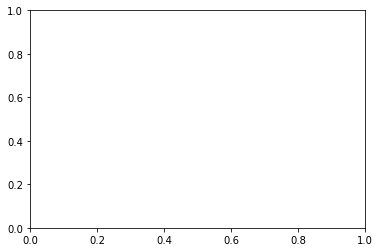

In [346]:
#plot bars in stack manner
plt.bar(prop_by_independent, prop_by_independent.Yes, color='r')
plt.bar(prop_by_independent, prop_by_independent.No, bottom=y1, color='b')
plt.show()

In [406]:
import math
#**************
def percentage_stacked_plot(columns_to_plot, super_title):
    
    '''
    Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
            Parameters:
                    columns_to_plot (list of string): Names of the variables to plot
                    super_title (string): Super title of the visualization
            Returns:
                    None
    '''
    
    number_of_columns = 2
    number_of_rows = math.ceil(len(columns_to_plot)/2)

    # create a figure
    fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
    fig.suptitle(super_title, fontsize=22,  y=.95)
 

    # loop to each column name to create a subplot
    for index, column in enumerate(columns_to_plot, 1):

        # create the subplot
        ax = plt.subplot(number_of_rows, number_of_columns, index)

        # calculate the percentage of observations of the response variable for each group of the independent variable
        # 100% stacked bar plot
        prop_by_independent = pd.crosstab(df_end[column], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

        prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
                                 rot=0, color=['springgreen','salmon'])

#         # set the legend in the upper right corner
#         ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
#                   title='Churn', fancybox=True)

#         # set title and labels
#         ax.set_title('Proportion of observations by ' + column,
#                      fontsize=16, loc='left')

#         ax.tick_params(rotation='auto')

#         # eliminate the frame from the plot
#         spine_names = ('top', 'right', 'bottom', 'left')
#         for spine_name in spine_names:
#             ax.spines[spine_name].set_visible(False)



In [408]:
cat_cols

['Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

AttributeError: 'SubplotSpec' object has no attribute 'is_first_col'

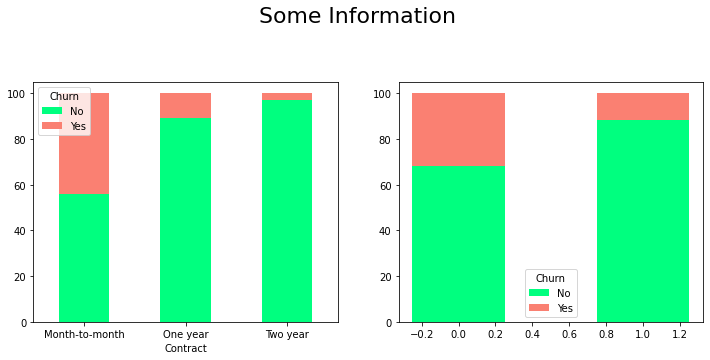

In [410]:
import matplotlib.pyplot as plt
# stacked plot of categorical columns
percentage_stacked_plot(cat_cols, 'Some Information')

In [318]:
# pip install --upgrade matplotlib

In [321]:
import matplotlib
matplotlib.__version__

'3.3.2'

In [339]:
import pandas
pandas.__version__

'2.0.3'

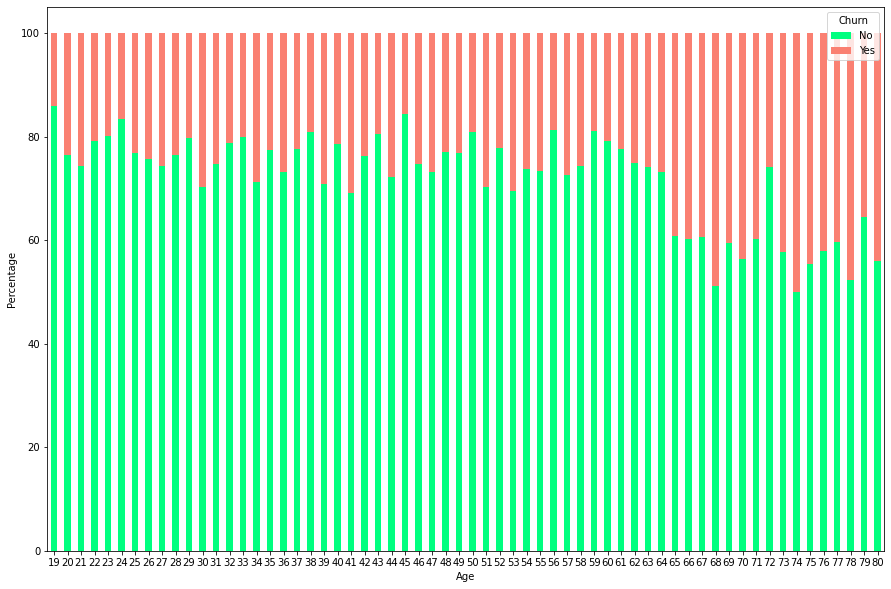

In [405]:
stacked_age = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

stacked_age.plot(figsize=(15, 10), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
plt.xlabel("Age")
plt.ylabel("Percentage")

plt.savefig("Percentage_Stacked_Age.jpg")

plt.show()


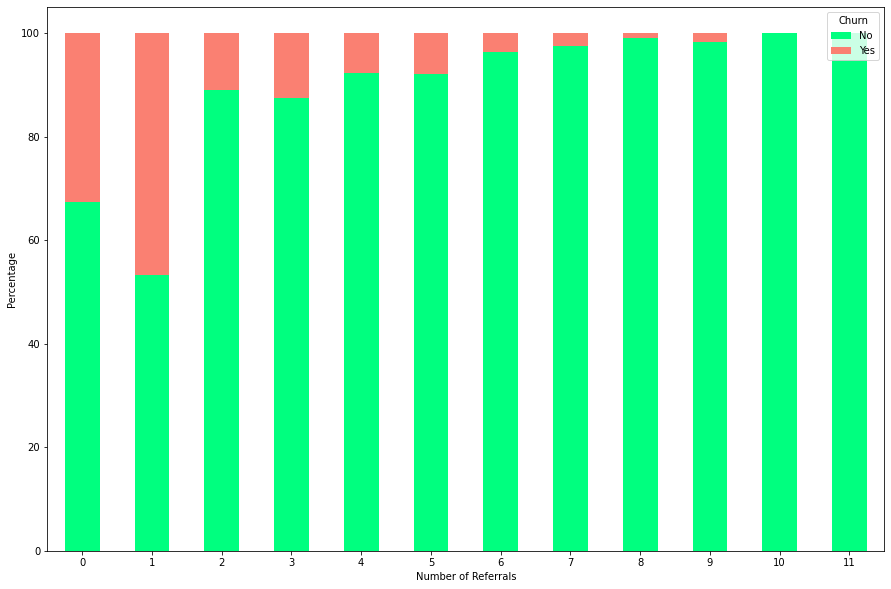

In [414]:
# fig = plt.figure(figsize=(2, 4)) 

stacked_age = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
stacked_nor = pd.crosstab(df_end['Number of Referrals'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)


# fig, axs = plt.subplots(2)
# plt.subplot(2, 1, 1)

# stacked_age.plot(figsize=(10, 6), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
# plt.xlabel("Age")
# plt.ylabel("Percentage")

# # plt.savefig("Percentage_Stacked_Age.jpg")
# plt.savefig("erdem.jpg")


# # plt.subplot(2, 1, 2)
stacked_nor.plot(figsize=(15, 10), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
plt.xlabel("Number of Referrals")
plt.ylabel("Percentage")


plt.savefig("Percentage_Stacked_NumberofReferral.jpg")
# plt.savefig("NOR.jpg")

plt.show()
 

In [411]:
cat_cols

['Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

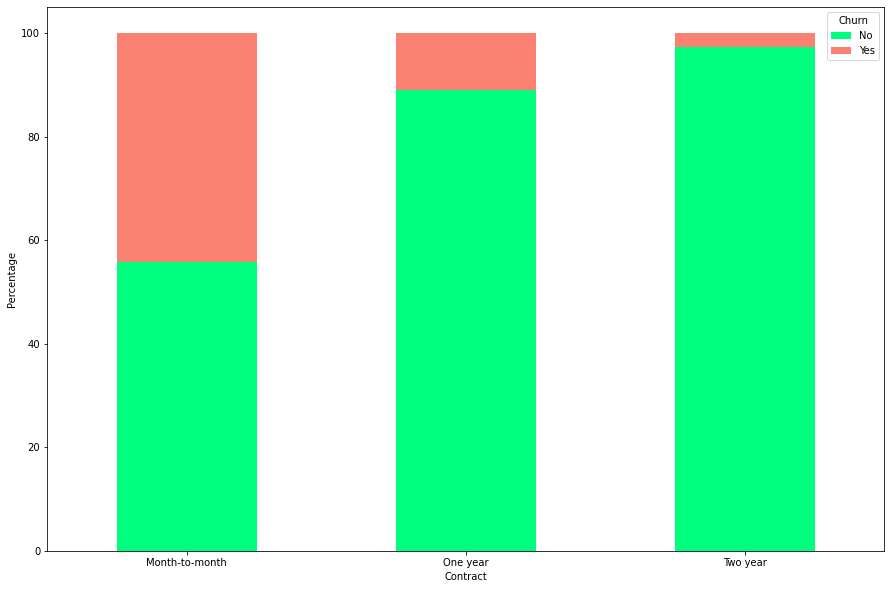

In [415]:
stacked_age = pd.crosstab(df_end['Contract'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

stacked_age.plot(figsize=(15, 10), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
plt.xlabel("Contract")
plt.ylabel("Percentage")

plt.savefig("Percentage_Stacked_Contract.pdf")

plt.show()

In [416]:
prop_by_independent

Churn,No,Yes
Number of Referrals,,
0,67.416907,32.583093
1,53.314917,46.685083
2,88.983051,11.016949
3,87.450980,12.549020
4,92.372881,7.627119
5,92.045455,7.954545
6,96.380090,3.619910
7,97.580645,2.419355
8,99.061033,0.938967


In [432]:
# agg_tips = tips.groupby(['day', 'sex'])['tip'].sum().unstack().fillna(0)

# prop_by_independent = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
# prop_by_independent

In [431]:
agg_tips = df_end.groupby(['Number of Referrals','Churn'])['Contract'].sum().unstack().fillna(0)
agg_tips

Churn,No,Yes
Number of Referrals,,
0,Month-to-monthOne yearOne yearMonth-to-monthMo...,Month-to-monthMonth-to-monthMonth-to-monthMont...
1,Month-to-monthTwo yearMonth-to-monthMonth-to-m...,Month-to-monthMonth-to-monthMonth-to-monthMont...
2,One yearOne yearTwo yearTwo yearTwo yearOne ye...,Month-to-monthMonth-to-monthMonth-to-monthMont...
3,Month-to-monthTwo yearOne yearMonth-to-monthOn...,Month-to-monthMonth-to-monthMonth-to-monthMont...
4,Two yearOne yearMonth-to-monthOne yearMonth-to...,Two yearMonth-to-monthMonth-to-monthMonth-to-m...
5,One yearTwo yearMonth-to-monthTwo yearMonth-to...,Month-to-monthOne yearMonth-to-monthMonth-to-m...
6,One yearOne yearMonth-to-monthOne yearTwo year...,Month-to-monthMonth-to-monthMonth-to-monthMont...
7,One yearTwo yearTwo yearTwo yearTwo yearTwo ye...,Month-to-monthMonth-to-monthOne yearMonth-to-m...
8,Two yearOne yearOne yearTwo yearOne yearTwo ye...,Month-to-monthMonth-to-monthMonth-to-monthMont...


In [436]:
num_cols

['Age', 'Number of Referrals']

In [433]:
age_churn = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
age_churn

Churn,No,Yes
Age,,
19,85.826772,14.173228
20,76.377953,23.622047
21,74.285714,25.714286
22,79.230769,20.769231
23,80.136986,19.863014
...,...,...
76,57.971014,42.028986
77,59.722222,40.277778
78,52.380952,47.619048


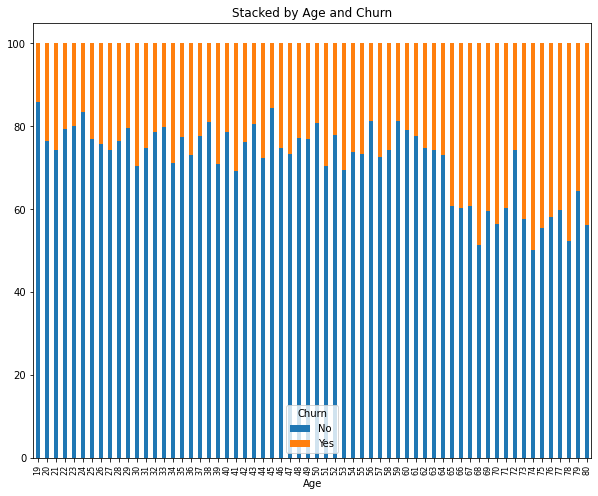

In [513]:
age_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Age and Churn')
plt.xticks(rotation=90, fontsize=8)
# plt.xticks(rotation=90, ha='center', fontsize=8)
plt.savefig("Stacked_Age&Churn.jpg")

plt.show()

In [434]:
nor_churn = pd.crosstab(df_end['Number of Referrals'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
nor_churn

Churn,No,Yes
Number of Referrals,,
0,67.416907,32.583093
1,53.314917,46.685083
2,88.983051,11.016949
3,87.450980,12.549020
4,92.372881,7.627119
5,92.045455,7.954545
6,96.380090,3.619910
7,97.580645,2.419355
8,99.061033,0.938967


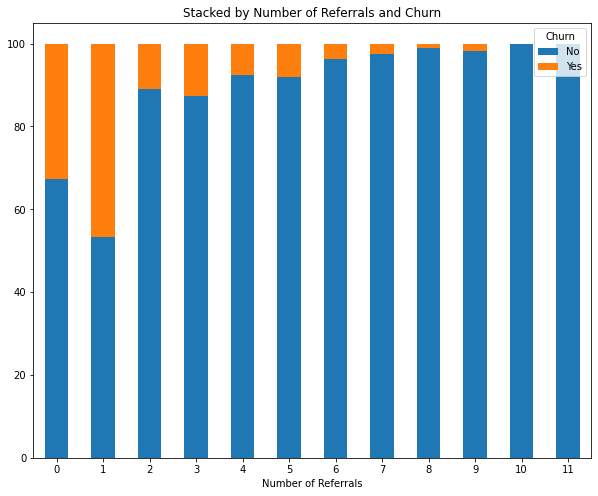

In [514]:
nor_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Number of Referrals and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Number of Referrals&Churn.jpg")

plt.show()

In [437]:
cat_cols

['Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [435]:
con_churn = pd.crosstab(df_end['Contract'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
con_churn

Churn,No,Yes
Contract,,
Month-to-month,55.778223,44.221777
One year,89.017532,10.982468
Two year,97.316937,2.683063


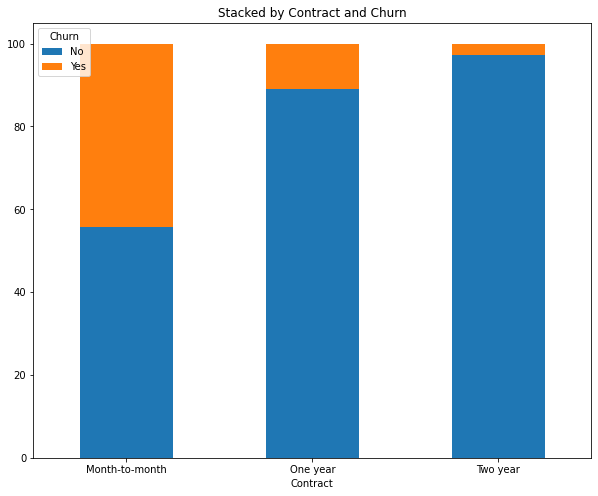

In [515]:
con_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Contract and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Contract&Churn.jpg")

plt.show()

In [438]:
dep_churn = pd.crosstab(df_end['Dependents'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
dep_churn

Churn,No,Yes
Dependents,,
No,68.054885,31.945115
Yes,88.439925,11.560075


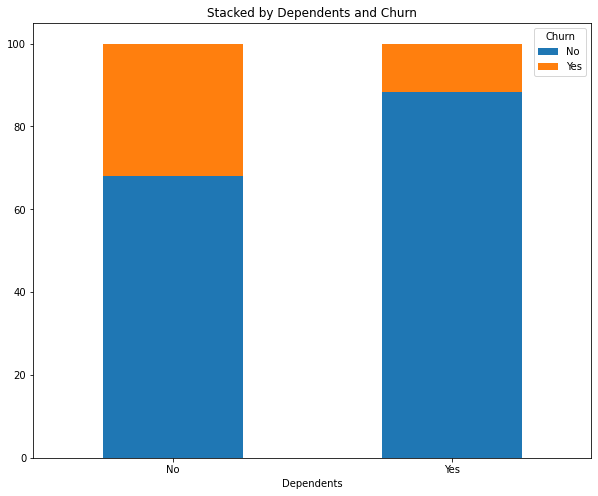

In [516]:
dep_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Dependents and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Dependents&Churn.jpg")

plt.show()

In [439]:
mar_churn = pd.crosstab(df_end['Married'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
mar_churn

Churn,No,Yes
Married,,
No,67.042021,32.957979
Yes,80.335097,19.664903


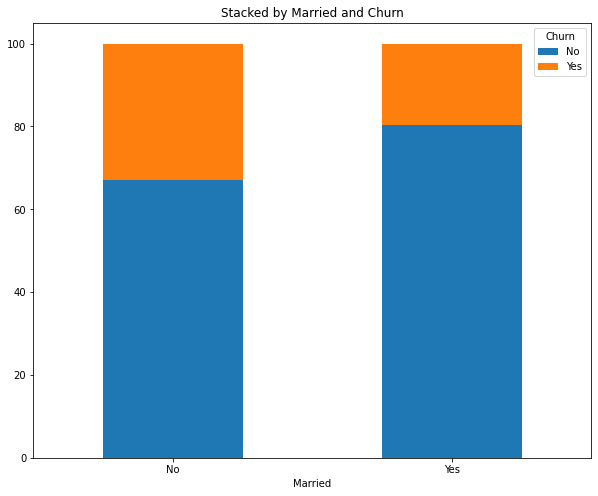

In [517]:
mar_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Married and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Married&Churn.jpg")

plt.show()

In [440]:
pre_churn = pd.crosstab(df_end['Premium Tech Support'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
pre_churn

Churn,No,Yes
Premium Tech Support,,
No,68.813763,31.186237
Yes,84.833659,15.166341


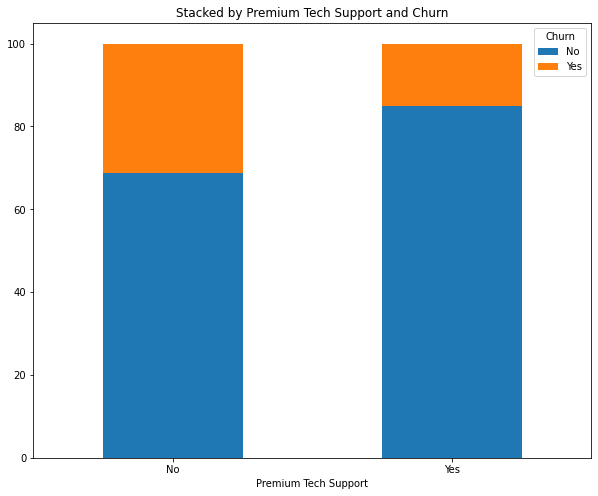

In [519]:
pre_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Premium Tech Support and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Premium Tech Support&Churn.jpg")

plt.show()

In [441]:
ref_churn = pd.crosstab(df_end['Referred a Friend'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
ref_churn

Churn,No,Yes
Referred a Friend,,
No,67.416907,32.583093
Yes,80.633147,19.366853


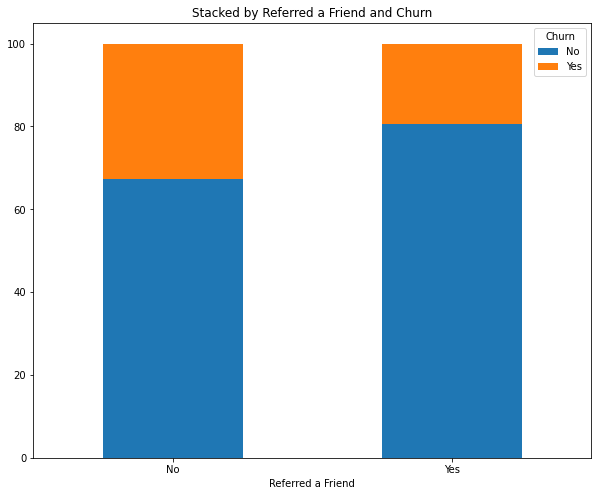

In [585]:
ref_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Referred a Friend and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Referred a Friend&Churn.jpg")

plt.show()

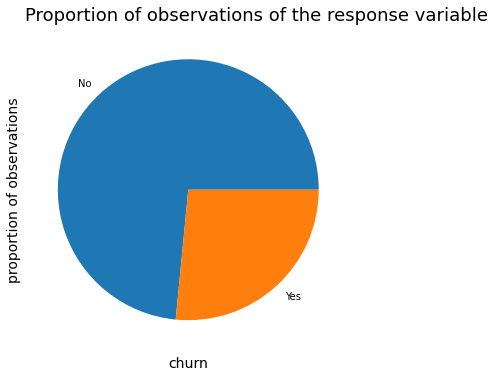

In [536]:
# create a figure
fig = plt.figure(figsize=(10, 6)) 
ax = fig.add_subplot(111)

# proportion of observation of each class
prop_response = df_end['Churn'].value_counts(normalize=True)

# create a bar plot showing the percentage of churn
# prop_response.plot(kind='bar', 
#                    ax=ax,
#                    color=['springgreen','salmon'])

prop_response.plot(kind='pie', 
                   ax=ax)

# set title and labels
ax.set_title('Proportion of observations of the response variable',
             fontsize=18, loc='left')
ax.set_xlabel('churn',
              fontsize=14)
ax.set_ylabel('proportion of observations',
              fontsize=14)
ax.tick_params(rotation='auto')

# eliminate the frame from the plot
spine_names = ('top', 'right', 'bottom', 'left')
for spine_name in spine_names:
    ax.spines[spine_name].set_visible(False)

In [547]:
# # Import libraries
# import numpy as np
# import matplotlib.pyplot as plt
 
 
# # Creating dataset
# cars = df_end['Churn'].value_counts(normalize=True)
# data = df_end['Churn'].value_counts(normalize=True)
 
 
# # Creating explode data
# explode = df_end['Churn'].value_counts(normalize=True)
 
# # Creating color parameters
# colors = ( "orange", "cyan", "brown",
#           "grey", "indigo", "beige")
 
# # Wedge properties
# wp = { 'linewidth' : 1, 'edgecolor' : "green" }
 
# # Creating autocpt arguments
# def func(pct, allvalues):
#     absolute = int(pct / 100.*np.sum(allvalues))
#     return "{:.1f}%\n({:d} g)".format(pct, absolute)
 
# # Creating plot
# fig, ax = plt.subplots(figsize =(10, 7))
# wedges, texts, autotexts = ax.pie(data, 
#                                   autopct = lambda pct: func(pct, data),
#                                   explode = explode, 
#                                   labels = cars,
#                                   shadow = True,
#                                   colors = colors,
#                                   startangle = 90,
#                                   wedgeprops = wp,
#                                   textprops = dict(color ="magenta"))
 
# # Adding legend
# ax.legend(wedges, cars,
#           title ="Churn Rates",
#           loc ="center left",
#           bbox_to_anchor =(1, 0, 0.5, 1))
 
# plt.setp(autotexts, size = 8, weight ="bold")
# ax.set_title("Normalized Stacked Pie-Chart")
 
# # show plot
# plt.show()

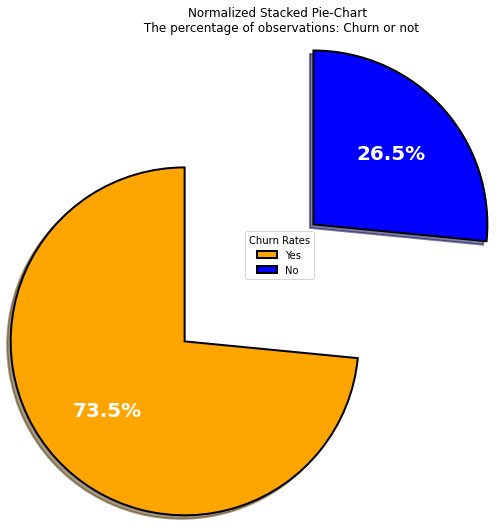

In [600]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset
cars = ['Yes', 'No']
data = df_end['Churn'].value_counts(normalize=True)
 
 
# Creating explode data
# explode = df_end['Churn'].value_counts(normalize=True)
 
# Creating color parameters
colors = ( "orange", "blue")
 
# Wedge properties
wp = { 'linewidth' : 2, 'edgecolor' : "black" }
 
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%".format(pct, absolute)
 
# Creating plot
fig, ax = plt.subplots(figsize =(10, 8))
wedges, texts, autotexts = ax.pie(data, 
                                  autopct = lambda pct: func(pct, data),
                                  explode = explode,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="white"))
 
# Adding legend
ax.legend(wedges, cars,
          title ="Churn Rates",
          loc ="center"),
#           bbox_to_anchor =(1, 0, 0.5, 1))
 
plt.setp(autotexts, size = 20, weight ="bold")
ax.set_title("Normalized Stacked Pie-Chart \n The percentage of observations: Churn or not")

plt.savefig("Normalized Stacked Pie-Chart&Churn.jpg")
 
# show plot
plt.show()

In [527]:
sennik = df_end['Age']

In [528]:
erdem = df_end['Churn']

In [520]:
ref_churn.plot(figsize=(10, 8), kind='pie', stacked=True)

plt.title('Stacked by Referred a Friend and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Referred a Friend&Churn.jpg")

plt.show()

ValueError: pie requires either y column or 'subplots=True'

AttributeError: 'SubplotSpec' object has no attribute 'is_first_col'

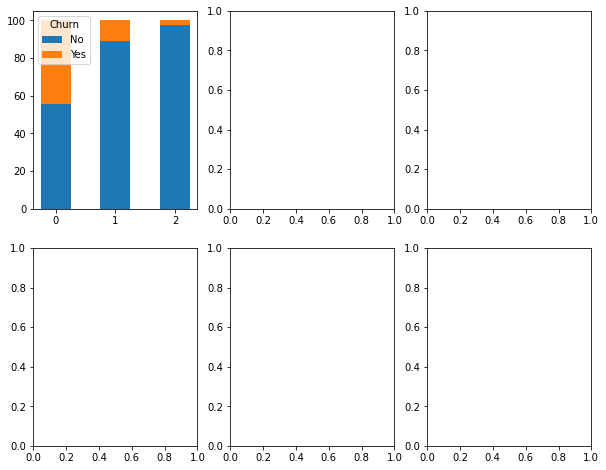

In [474]:
fig, axes = plt.subplots(nrows=2, ncols=3)

con_churn.plot(ax = axes[0,0], figsize=(10, 8), kind='bar', stacked=True)
dep_churn.plot(ax = axes[0,1], figsize=(10, 8), kind='bar', stacked=True)
# mar_churn.plot(ax = axes[0,2], figsize=(10, 8), kind='bar', stacked=True)
# pre_churn.plot(ax = axes[1,0], figsize=(10, 8), kind='bar', stacked=True)
# ref_churn.plot(ax = axes[1,1], figsize=(10, 8), kind='bar', stacked=True)

plt.show()



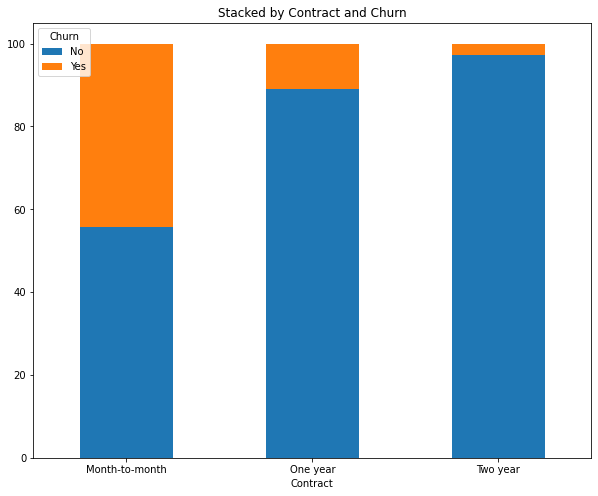

In [512]:
con_churn.plot(figsize=(10, 8), kind='bar', stacked=True)
plt.title('Stacked by Contract and Churn')
plt.xticks(rotation=0, fontsize=10)

plt.savefig("Stacked_ConChurn.jpg")

plt.show()

In [481]:
import numpy
numpy. __version__

'1.20.3'

In [482]:
import pandas
pandas. __version__

'2.0.3'

In [483]:
import matplotlib
matplotlib. __version__

'3.3.2'

NameError: name 'hue_norm' is not defined

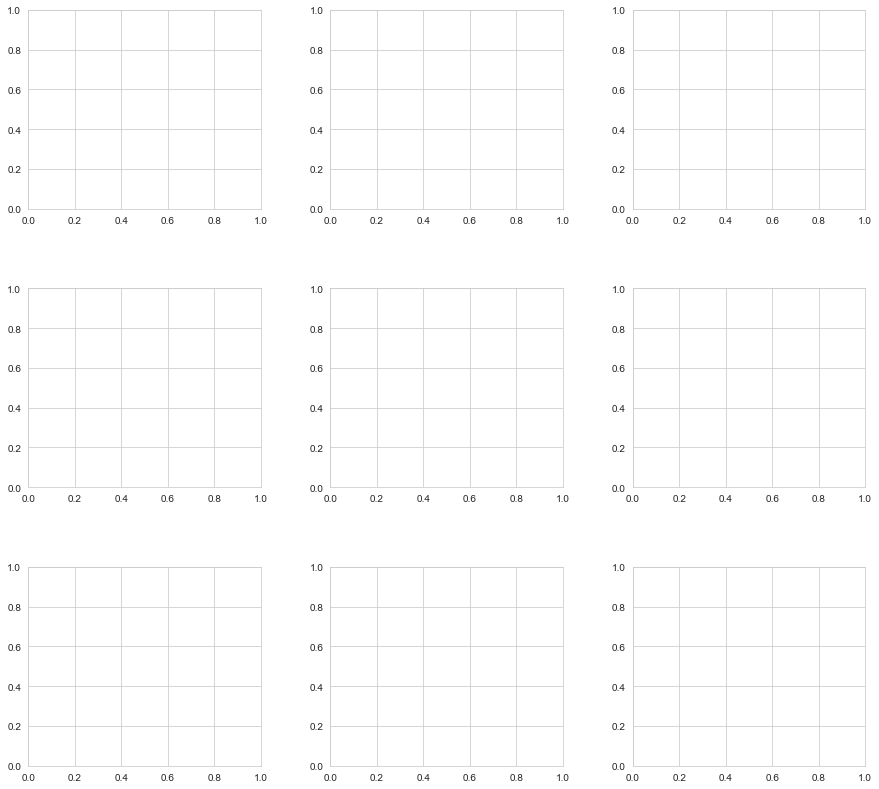

In [640]:
fig, ax = plt.subplots(3, 3, figsize=(15, 12))
plt.subplots_adjust(left=None, bottom=None, right=None, top=1, wspace=0.3, hspace=0.4)
for variable, subplot in zip(df_end.columns, ax.flatten()):
  sns.histplot(df_end[variable], hue_norm=='Churn', ax=subplot)

In [591]:
# # Divide the columns into 2 categories, one for ordinal encoding and one for one hot encoding

# from sklearn.preprocessing import OneHotEncoder

# columns_to_encode_2 = ['Payment Method', 'Contract', 'Internet Service']

# # Subset the DataFrame with the columns to encode
# data_to_encode = df_encoded[columns_to_encode_2]

# # Initialize OneHotEncoder
# encoder = OneHotEncoder(sparse=False, drop='first')

# # Fit and transform the data
# encoded_data = encoder.fit_transform(data_to_encode)

# # Create new column names for the encoded columns
# encoded_columns = encoder.get_feature_names_out(input_features=columns_to_encode_2)

# # Create a DataFrame from the encoded data
# encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns, index=data_to_encode.index)

# # Drop the original columns from df_encoded and concatenate the encoded columns
# df_encoded.drop(columns_to_encode_2, axis=1, inplace=True)
# df_encoded = pd.concat([df_encoded, encoded_df], axis=1)

In [590]:
# plt.figure(figsize=(15,8))
# df_end.corr()['Churn'].sort_values(ascending = False).plot(kind='bar')

In [599]:
X_train

,Age,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
5173,50,0,0,0,0,0,0
798,41,0,0,0,0,0,0
3261,60,1,2,1,1,1,1
1802,36,1,0,1,1,0,1
5461,45,0,0,0,0,0,0
...,...,...,...,...,...,...,...
4489,61,2,2,0,1,0,1
5426,77,5,1,0,1,0,1
565,70,0,1,0,0,0,0
4213,23,0,0,0,0,0,0


In [601]:
# !pip install imblearn

In [602]:
!pip install -U imbalanced-learn

  Using cached imbalanced_learn-0.11.0-py3-none-any.whl (235 kB)


In [648]:
from imblearn.over_sampling import SMOTE

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

In [605]:
from imblearn import under_sampling, over_sampling

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

In [606]:
from imblearn.over_sampling import BorderlineSMOTE

# Instantiate BorderlineSMOTE
borderline_smote = BorderlineSMOTE(random_state=42, kind = 'borderline-2')

# Print shapes before applying BorderlineSMOTE
print("Shapes before BorderlineSMOTE:")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

# Apply BorderlineSMOTE only on the training data
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train, y_train)

# Print shapes after applying BorderlineSMOTE
print("\nShapes after BorderlineSMOTE:")
print(f"X_train_balanced shape: {X_train_balanced.shape}")
print(f"y_train_balanced shape: {y_train_balanced.shape}")

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

C:\Users\esennik\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ValueError: Multi-dimensional indexing (e.g. `obj[:, None]`) is no longer supported. Convert to a numpy array before indexing instead.

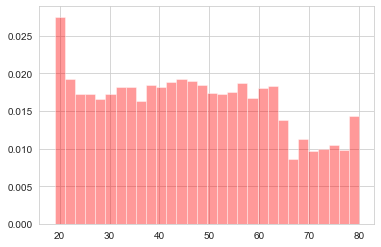

In [634]:
import seaborn as sns
sns.set_style('whitegrid')
sns.distplot(df_end['Age'], kde = True, color ='red', bins = 30)

plt.show()

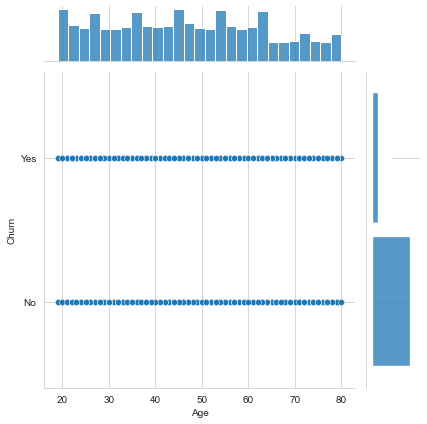

In [614]:
sns.jointplot(x ='Age', y ='Churn', data = df_end)

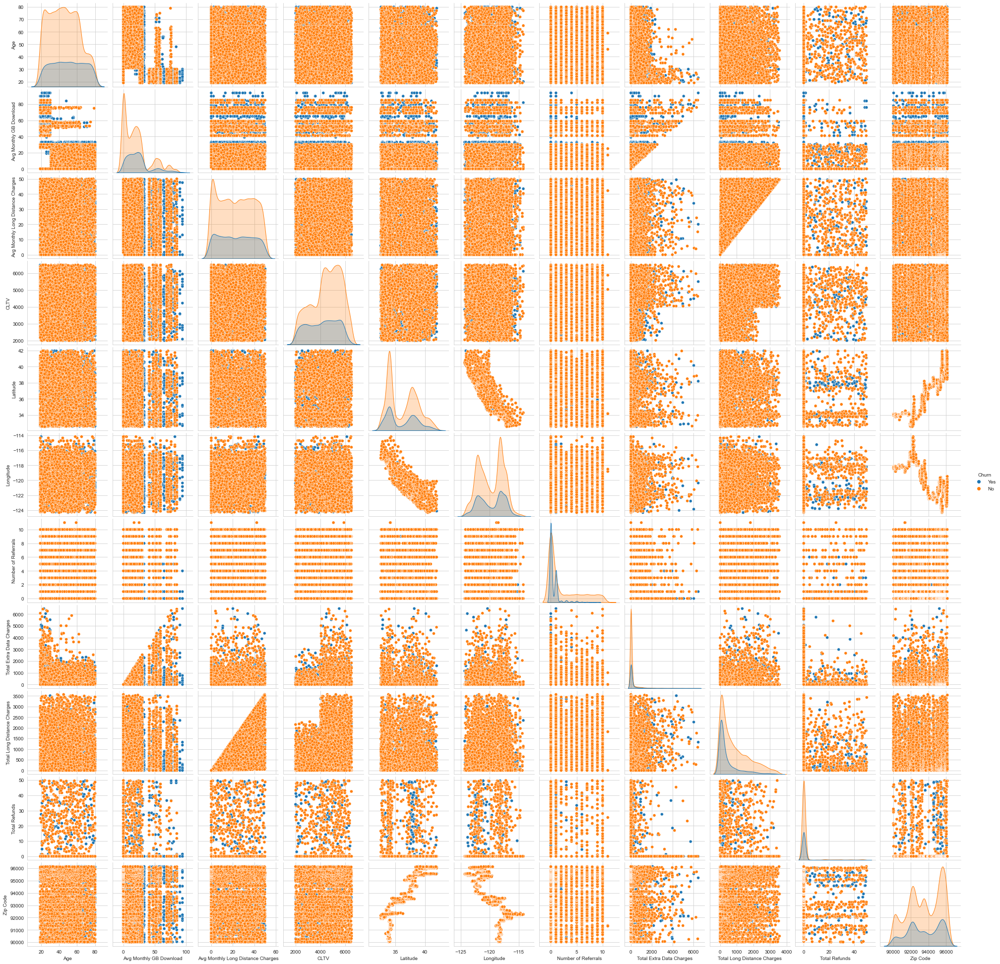

In [641]:
sns.pairplot(data = df_telco, hue='Churn')
plt.show()

In [619]:
# # Categorical-numerical variables
# fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))
# ## Are churned customers likely to get charged more?plt.subplot(1,3,1)
# sns.boxplot(df_end['Churn'], df_end['Age'])
# plt.title('Age vs Churn')
# ## When do customers churn?
# plt.subplot(1,3,2)
# sns.boxplot(df_end['Churn'], df_end['Age'])
# plt.title('Tenure vs Churn')
# ## Are senior citizen more likely to churn?
# plt.subplot(1,3,3)
# counts = (df_end.groupby(['Churn'])['Married']
#   .value_counts(normalize=True)
#   .rename('percentage')
#   .mul(100)
#   .reset_index())
# plot = sns.barplot(x="Married", y="percentage", hue="Churn", data=counts).set_title('Married vs Churn')


# plt.show()

ValueError: Could not interpret input 'Number of Referrals'

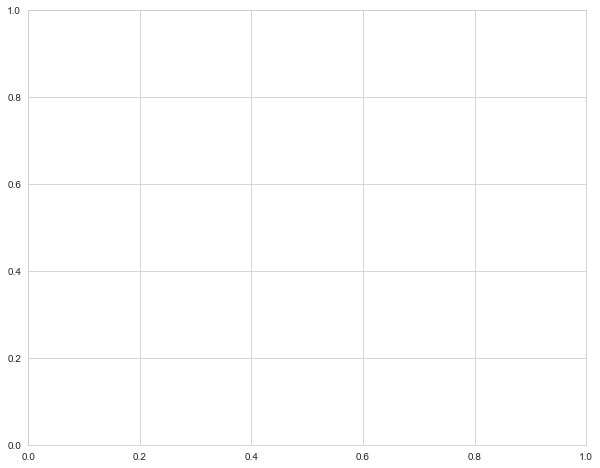

In [633]:
# Categorical-numerical variables
fig, axes = plt.subplots(figsize=(10, 8))
## Are churned customers likely to get charged more?plt.subplot(1,3,1)
# sns.boxplot(df_end['Churn'], df_end['Age'])
plot = sns.barplot(x="Churn", y="Number of Referrals", hue="Churn", data=counts).set_title('Age vs Churn')
plt.title('Age vs Churn')
plt.legend('Churn')


plt.show()

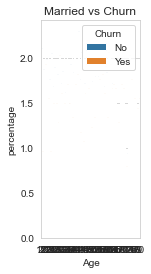

In [628]:
## Are senior citizen more likely to churn?
plt.subplot(1,3,3)
counts = (df_end.groupby(['Churn'])['Age']
  .value_counts(normalize=True)
  .rename('percentage')
  .mul(100)
  .reset_index())
plot = sns.barplot(x="Age", y="percentage", hue="Churn", data=counts).set_title('Age vs Churn')


plt.show()

### Deal with imbalanced data by doing below

In [646]:
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.model_selection import cross_val_score
# # define model
# mdl1 = RandomForestClassifier()
# # evaluate pipeline
# # cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# scores = cross_val_score(mdl1, X, y, scoring='roc_auc', n_jobs=-1)

In [647]:
...
# define pipeline
steps = [('over', SMOTE()), ('model', DecisionTreeClassifier())]
pipeline = Pipeline(steps=steps)

NameError: name 'SMOTE' is not defined

In [649]:
from imblearn.over_sampling import SMOTENC

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

In [ ]:
from imblearn.over_sampling import SMOTENC

smote = SMOTENC(categorical_features=(x_train.dtypes == "category").values,
                random_state=42)

x_train, y_train = smote.fit_resample(x_train, y_train)

x_train_cat, y_train_cat = smote.fit_resample(x_train_cat, y_train_cat)

In [651]:
!pip install imbalanced-learn

In [653]:
# # check version number
# import imblearn

In [656]:
# check version number
import sklearn
print(sklearn.__version__)

0.23.2


In [660]:
df_end['Churn'].value_counts()

Churn
No     10348
Yes     3738
Name: count, dtype: int64

C:\Users\esennik\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn', ylabel='count'>

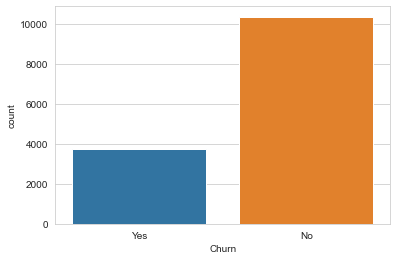

In [661]:
sns.countplot(df_end['Churn'])

In [662]:
from sklearn.utils import resample

In [663]:
df_majority = df_end[(df_end['Churn'] == 'No')]
df_minority = df_end[(df_end['Churn'] == 'Yes')]

In [673]:
df_minority_upsampled = resample(df_minority, replace = True, n_samples = 10348, random_state = 42)#, replace=True, n_sample=10348, random_state=42)
df_upsampled = pd.concat([df_minority_upsampled, df_majority])

In [674]:
df_upsampled['Churn'].value_counts()

Churn
Yes    10348
No     10348
Name: count, dtype: int64

C:\Users\esennik\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn', ylabel='count'>

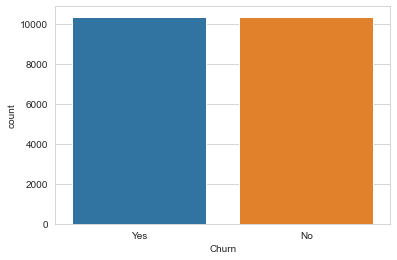

In [675]:
sns.countplot(df_upsampled['Churn'])

In [676]:
df_upsampled.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
1971,42,0,Yes,Month-to-month,No,No,No,No
2304,46,0,Yes,Month-to-month,No,No,No,No
860,53,0,Yes,One year,No,No,No,No
1294,20,0,Yes,Month-to-month,No,No,No,No
1130,66,0,Yes,Month-to-month,No,No,No,No


In [685]:
from sklearn.preprocessing import LabelEncoder
le_con = LabelEncoder()
le_dep = LabelEncoder()
le_mar = LabelEncoder()
le_pre = LabelEncoder()
le_ref = LabelEncoder()


In [686]:
df_upsampled_transformed = df_upsampled.copy()

df_upsampled_transformed['Contract'] = le_cat.fit_transform(df_upsampled_transformed['Contract'])
df_upsampled_transformed['Dependents'] = le_cat.fit_transform(df_upsampled_transformed['Dependents'])
df_upsampled_transformed['Married'] = le_cat.fit_transform(df_upsampled_transformed['Married'])
df_upsampled_transformed['Premium Tech Support'] = le_cat.fit_transform(df_upsampled_transformed['Premium Tech Support'])
df_upsampled_transformed['Referred a Friend'] = le_cat.fit_transform(df_upsampled_transformed['Referred a Friend'])

df_upsampled_transformed.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
1971,42,0,Yes,0,0,0,0,0
2304,46,0,Yes,0,0,0,0,0
860,53,0,Yes,1,0,0,0,0
1294,20,0,Yes,0,0,0,0,0
1130,66,0,Yes,0,0,0,0,0


In [689]:
# select independent variables
X1 = df_upsampled_transformed.drop(columns='Churn')

# select dependent variables
y1 = df_upsampled_transformed.loc[:, 'Churn']


In [690]:
X1.head()

,Age,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
1971,42,0,0,0,0,0,0
2304,46,0,0,0,0,0,0
860,53,0,1,0,0,0,0
1294,20,0,0,0,0,0,0
1130,66,0,0,0,0,0,0


In [691]:
y1.head()

1971    Yes
2304    Yes
860     Yes
1294    Yes
1130    Yes
Name: Churn, dtype: object

In [681]:
# from sklearn.model_selection import train_test_split

# # # split the data in training and testing sets
# # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
# #                                                     random_state=40, shuffle=True)
# # from sklearn.model_selection import train_test_split
# 
# # # split the data in training and testing sets
# # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40, shuffle=True)
# #   

In [692]:
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()



In [693]:
from sklearn.metrics import accuracy_score

###
# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # fit the model with the training data
    model.fit(X1, y1)
    # make predictions with the testing data
    predictions = model.predict(X1)
    # calculate accuracy 
    accuracy = accuracy_score(y1, predictions)
    # append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

Classifier: dummy_classifier, Accuracy: 0.5)
Classifier: k_nearest_neighbors, Accuracy: 0.8103981445689988)
Classifier: support_vector_machines, Accuracy: 0.7625144955546965)
Classifier: random_forest, Accuracy: 0.8465887127947429)
Classifier: gradient_boosting, Accuracy: 0.7901043679938152)


In [ ]:
Classifier: dummy_classifier, Accuracy: 0.7346301292063041)
Classifier: k_nearest_neighbors, Accuracy: 0.8027829050120687)
Classifier: support_vector_machines, Accuracy: 0.756282834019594)
Classifier: random_forest, Accuracy: 0.8343035638222348)
Classifier: gradient_boosting, Accuracy: 0.7939798381371574)

In [707]:
matplotlib.__version__

'3.3.2'

In [708]:
pandas.__version__

'2.0.3'

In [709]:
numpy.__version__

'1.20.3'

In [711]:
import seaborn
seaborn.__version__

'0.11.0'

In [713]:
import streamlit
streamlit.__version__

'1.29.0'

In [714]:
import sklearn
sklearn.__version__

'0.23.2'

In [716]:
import math


In [718]:
matplotlib.__version__

'3.3.2'

In [719]:
!pip list command

Package                            Version
---------------------------------- -------------------
alabaster                          0.7.12
altair                             4.2.0
anaconda-client                    1.7.2
anaconda-navigator                 1.10.0
anaconda-project                   0.8.3
anyio                              3.5.0
AnyQt                              0.1.1
argh                               0.26.2
argon2-cffi                        20.1.0
asn1crypto                         1.4.0
astroid                            2.4.2
astropy                            4.0.2
async-generator                    1.10
atomicwrites                       1.4.0
attrs                              20.3.0
Automat                            22.10.0
autopep8                           1.5.4
aws                                0.2.5
Babel                              2.8.1
backcall                           0.2.0
backports.functools-lru-cache      1.6.4
backports.shutil-get-terminal-size 

In [ ]:
scikit-learn                       1.3.2
pandas                             2.0.3
numpy                              1.20.3
streamlit                          1.29.0

In [723]:
!pip install scikit-learn == 1.2.2 --user

ERROR: Invalid requirement: '=='


<span style='color:black'>**Telco Customer Churn**<span>

<span style='color:black'>This work aims to provide a web app to a related department of any business to show them the churn possibility. Based on this information, the department can take action not to lose their customer.</span>

In [97]:
import numpy as np
import pandas as pd

#### Note: Based on the comment (from the instructor) on my previous capstone project presentation, I included two dataset and tried to merge them in terms of the similarities. I found three dataset for this topic and chose two of them. 

In [98]:
df1 = pd.read_csv("churn_100k.csv")
df1.head()

,monthly_minutes,customerServiceCalls,streaming_minutes,TotalBilled,PrevBalance,latePayments,ip_address_asn,phone_area_code,customer_reg_date,email_domain,...,maling_code,paperlessBilling,paymentMethod,EVENT_TIMESTAMP,customerId,billing_address,gender,networkSpeed,senior_citizen,EVENT_LABEL
0,22604.0,2.0,26525.0,285.0,47.0,5.0,16767.0,253.0,2020-04-15,yahoo.com,...,H,No,Mailed Check,2019-11-30 23:48:32,1-136-08562-9,5592 Gill Pine Suite 387,Female,5G,1.0,legit
1,17059.0,2.0,16887.0,201.0,45.0,5.0,53966.0,241.0,2020-04-12,gmail.com,...,V,Yes,Mailed Check,2020-09-27 03:23:42,0-384-11264-1,5806 Kathleen Mount Suite 186,Male,5G,0.0,legit
2,25848.0,2.0,26783.0,264.0,44.0,6.0,19278.0,232.0,2020-02-22,gmail.com,...,R,Yes,Credit Card,2020-01-12 15:18:38,0-08-151665-7,5037 Allen Square Apt. 727,Male,5G,1.0,legit
3,22080.0,3.0,23649.0,274.0,49.0,6.0,16680.0,236.0,2020-08-05,yahoo.com,...,N,No,Mailed Check,2020-10-09 18:07:46,0-02-200816-0,841 Griffin Route Suite 824,Female,5G,0.0,legit
4,23871.0,3.0,7705.0,236.0,61.0,5.0,51308.0,243.0,2019-11-16,gmail.com,...,V,Yes,Electronic Check,2020-10-17 22:27:42,0-87476-135-2,46185 Mejia Manor Apt. 558,Male,4Glte,1.0,legit


In [99]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101000 entries, 0 to 100999
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   monthly_minutes       100978 non-null  float64
 1   customerServiceCalls  100973 non-null  float64
 2   streaming_minutes     100977 non-null  float64
 3   TotalBilled           100964 non-null  float64
 4   PrevBalance           100973 non-null  float64
 5   latePayments          100977 non-null  float64
 6   ip_address_asn        100982 non-null  float64
 7   phone_area_code       100970 non-null  float64
 8   customer_reg_date     100969 non-null  object 
 9   email_domain          100969 non-null  object 
 10  phoneModel            100974 non-null  object 
 11  billing_city          100969 non-null  object 
 12  billing_postal        100970 non-null  float64
 13  billing_state         100971 non-null  object 
 14  partner               100971 non-null  object 
 15  

In [100]:
df1[['EVENT_LABEL', 'EVENT_TIMESTAMP']]

,EVENT_LABEL,EVENT_TIMESTAMP
0,legit,2019-11-30 23:48:32
1,legit,2020-09-27 03:23:42
2,legit,2020-01-12 15:18:38
3,legit,2020-10-09 18:07:46
4,legit,2020-10-17 22:27:42
...,...,...
100995,legit,2019-11-16 12:22:04
100996,legit,2019-11-29 07:47:44
100997,legit,2020-01-03 06:18:32
100998,legit,2020-08-27 00:16:19


In [101]:
df2 = pd.read_csv("Telco_customer_churn.csv")
df2.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,Premium Tech Support,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Customer Status,Churn Score.1,Churn Category
0,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,Yes,0.0,0,20.94,129.09,1,Churned,86,Competitor
1,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,Yes,0.0,0,18.24,169.89,2,Churned,67,Other
2,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,No,Yes,0.0,0,97.20,917.70,3,Churned,86,Other
3,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,0.0,0,136.92,3182.97,3,Churned,84,Other
4,0280-XJGEX,Male,0,No,No,49,Yes,Yes,Fiber optic,No,...,No,Yes,0.0,0,2172.17,7208.47,1,Churned,89,Competitor


In [102]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 52 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   customerID                         7043 non-null   object 
 1   gender                             7043 non-null   object 
 2   SeniorCitizen                      7043 non-null   int64  
 3   Partner                            7043 non-null   object 
 4   Dependents                         7043 non-null   object 
 5   tenure                             7043 non-null   int64  
 6   PhoneService                       7043 non-null   object 
 7   MultipleLines                      7043 non-null   object 
 8   InternetService                    7043 non-null   object 
 9   OnlineSecurity                     7043 non-null   object 
 10  OnlineBackup                       7043 non-null   object 
 11  DeviceProtection                   7043 non-null   objec

In [103]:
df2[['Customer Status', 'Churn']]

,Customer Status,Churn
0,Churned,Yes
1,Churned,Yes
2,Churned,Yes
3,Churned,Yes
4,Churned,Yes
...,...,...
7038,Stayed,No
7039,Stayed,No
7040,Stayed,No
7041,Stayed,No


In [104]:
df3 = pd.read_csv("telco_churn_data.csv")
df3.head()

,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,...,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
0,8779-QRDMV,No,0,1,NaN,No,0.00,No,Yes,Fiber Optic,...,34.023810,-118.156582,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN
1,7495-OOKFY,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,...,34.044271,-118.185237,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN
2,1658-BYGOY,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,...,34.108833,-118.229715,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN
3,4598-XLKNJ,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,...,33.936291,-118.332639,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0
4,4846-WHAFZ,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,...,33.972119,-118.020188,26265,1,2793,Price,Extra data charges,1,0,2.0


In [105]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Referred a Friend                  7043 non-null   object 
 2   Number of Referrals                7043 non-null   int64  
 3   Tenure in Months                   7043 non-null   int64  
 4   Offer                              3166 non-null   object 
 5   Phone Service                      7043 non-null   object 
 6   Avg Monthly Long Distance Charges  7043 non-null   float64
 7   Multiple Lines                     7043 non-null   object 
 8   Internet Service                   7043 non-null   object 
 9   Internet Type                      5517 non-null   object 
 10  Avg Monthly GB Download            7043 non-null   int64  
 11  Online Security                    7043 non-null   objec

In [106]:
df3[['Churn Value']]

,Churn Value
0,1
1,1
2,1
3,1
4,1
...,...
7038,0
7039,0
7040,0
7041,0


In [107]:
df3['Churn'] = df3['Churn Value']

In [108]:
change_columns = ['Churn']

for column in change_columns:
    if column == 'Churn':
        df3[column] = df3[column].map({1: 'Yes', 0: 'No'})
    

In [109]:
df3['Churn'].unique()

array(['Yes', 'No'], dtype=object)

#### Tried to find the max affinity for the two data set I chose

In [110]:
list(set(df1.columns) & set(df2.columns) & set(df3.columns))

[]

In [111]:
list(set(df1.columns) & set(df2.columns))

['MultipleLines', 'OnlineBackup', 'gender', 'PhoneService']

In [112]:
list(set(df1.columns) & set(df3.columns))

[]

In [113]:
list(set(df2.columns) & set(df3.columns))

['Total Refunds',
 'Referred a Friend',
 'Churn',
 'Offer',
 'Unlimited Data',
 'Total Extra Data Charges',
 'Premium Tech Support',
 'Age',
 'Contract',
 'Dependents',
 'Zip Code',
 'CLTV',
 'City',
 'Total Long Distance Charges',
 'Married',
 'Streaming Music',
 'Avg Monthly GB Download',
 'Under 30',
 'Longitude',
 'Latitude',
 'Churn Reason',
 'Churn Category',
 'Avg Monthly Long Distance Charges',
 'Number of Referrals']

In [114]:
# Finding Common columns
b = np.intersect1d(df2.columns, df3.columns)
 
# Printing common columns
print ("Common Columns:",b, len(b))

Common Columns: ['Age' 'Avg Monthly GB Download' 'Avg Monthly Long Distance Charges'
 'CLTV' 'Churn' 'Churn Category' 'Churn Reason' 'City' 'Contract'
 'Dependents' 'Latitude' 'Longitude' 'Married' 'Number of Referrals'
 'Offer' 'Premium Tech Support' 'Referred a Friend' 'Streaming Music'
 'Total Extra Data Charges' 'Total Long Distance Charges' 'Total Refunds'
 'Under 30' 'Unlimited Data' 'Zip Code'] 24


In [115]:
df3_2=df3[b]
df3_2.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,CLTV,Churn,Churn Category,Churn Reason,City,Contract,Dependents,...,Offer,Premium Tech Support,Referred a Friend,Streaming Music,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Under 30,Unlimited Data,Zip Code
0,78,9,0.00,5433,Yes,Competitor,Competitor offered more data,Los Angeles,Month-to-Month,No,...,NaN,No,No,No,0.0,0.00,0.00,No,No,90022
1,74,19,48.85,5302,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-Month,Yes,...,Offer E,No,Yes,No,120.0,390.80,0.00,No,No,90063
2,71,57,11.33,3179,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-Month,Yes,...,Offer D,No,No,Yes,0.0,203.94,45.61,No,Yes,90065
3,78,13,19.76,5337,Yes,Dissatisfaction,Limited range of services,Inglewood,Month-to-Month,Yes,...,Offer C,No,Yes,No,327.0,494.00,13.43,No,No,90303
4,80,15,6.33,2793,Yes,Price,Extra data charges,Whittier,Month-to-Month,Yes,...,Offer C,No,Yes,No,430.0,234.21,0.00,No,No,90602


In [116]:
df3_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                7043 non-null   int64  
 1   Avg Monthly GB Download            7043 non-null   int64  
 2   Avg Monthly Long Distance Charges  7043 non-null   float64
 3   CLTV                               7043 non-null   int64  
 4   Churn                              7043 non-null   object 
 5   Churn Category                     1869 non-null   object 
 6   Churn Reason                       1869 non-null   object 
 7   City                               7043 non-null   object 
 8   Contract                           7043 non-null   object 
 9   Dependents                         7043 non-null   object 
 10  Latitude                           7043 non-null   float64
 11  Longitude                          7043 non-null   float

In [117]:
df2_3=df2[b]
df2_3.head()

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,CLTV,Churn,Churn Category,Churn Reason,City,Contract,Dependents,...,Offer,Premium Tech Support,Referred a Friend,Streaming Music,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Under 30,Unlimited Data,Zip Code
0,37,21,10.47,3239,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0,20.94,0.0,No,Yes,90003
1,19,51,9.12,2701,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0,18.24,0.0,Yes,Yes,90005
2,31,26,12.15,5372,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0,97.20,0.0,No,Yes,90006
3,23,47,4.89,5003,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,Offer C,Yes,No,Yes,0,136.92,0.0,Yes,Yes,90010
4,38,11,44.33,5340,Yes,Competitor,Competitor had better devices,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0,2172.17,0.0,No,Yes,90015


In [118]:
df2_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                7043 non-null   int64  
 1   Avg Monthly GB Download            7043 non-null   int64  
 2   Avg Monthly Long Distance Charges  7043 non-null   float64
 3   CLTV                               7043 non-null   int64  
 4   Churn                              7043 non-null   object 
 5   Churn Category                     7043 non-null   object 
 6   Churn Reason                       1869 non-null   object 
 7   City                               7043 non-null   object 
 8   Contract                           7043 non-null   object 
 9   Dependents                         7043 non-null   object 
 10  Latitude                           7043 non-null   float64
 11  Longitude                          7043 non-null   float

In [119]:
df_telco=pd.concat([df2_3, df3_2])
df_telco

,Age,Avg Monthly GB Download,Avg Monthly Long Distance Charges,CLTV,Churn,Churn Category,Churn Reason,City,Contract,Dependents,...,Offer,Premium Tech Support,Referred a Friend,Streaming Music,Total Extra Data Charges,Total Long Distance Charges,Total Refunds,Under 30,Unlimited Data,Zip Code
0,37,21,10.47,3239,Yes,Competitor,Competitor made better offer,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0.0,20.94,0.00,No,Yes,90003
1,19,51,9.12,2701,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,No,0.0,18.24,0.00,Yes,Yes,90005
2,31,26,12.15,5372,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0.0,97.20,0.00,No,Yes,90006
3,23,47,4.89,5003,Yes,Other,Moved,Los Angeles,Month-to-month,No,...,Offer C,Yes,No,Yes,0.0,136.92,0.00,Yes,Yes,90010
4,38,11,44.33,5340,Yes,Competitor,Competitor had better devices,Los Angeles,Month-to-month,No,...,NaN,No,No,Yes,0.0,2172.17,0.00,No,Yes,90015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,30,0,22.77,5306,No,NaN,NaN,Landers,Two Year,No,...,NaN,No,No,No,0.0,1639.44,19.31,No,No,92285
7039,38,24,36.05,2140,No,NaN,NaN,Adelanto,One Year,Yes,...,Offer C,Yes,Yes,Yes,0.0,865.20,48.23,No,Yes,92301
7040,30,59,29.66,5560,No,NaN,NaN,Amboy,One Year,Yes,...,NaN,No,Yes,Yes,4344.0,2135.52,45.38,No,No,92304
7041,32,17,0.00,2793,No,NaN,NaN,Angelus Oaks,Month-to-Month,Yes,...,NaN,No,Yes,No,0.0,0.00,27.24,No,Yes,92305


In [120]:
df_telco.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14086 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                14086 non-null  int64  
 1   Avg Monthly GB Download            14086 non-null  int64  
 2   Avg Monthly Long Distance Charges  14086 non-null  float64
 3   CLTV                               14086 non-null  int64  
 4   Churn                              14086 non-null  object 
 5   Churn Category                     8912 non-null   object 
 6   Churn Reason                       3738 non-null   object 
 7   City                               14086 non-null  object 
 8   Contract                           14086 non-null  object 
 9   Dependents                         14086 non-null  object 
 10  Latitude                           14086 non-null  float64
 11  Longitude                          14086 non-null  float64
 

In [121]:
df_telco.shape

(14086, 24)

In [122]:
df_telco.isnull().any()

Age                                  False
Avg Monthly GB Download              False
Avg Monthly Long Distance Charges    False
CLTV                                 False
Churn                                False
Churn Category                        True
Churn Reason                          True
City                                 False
Contract                             False
Dependents                           False
Latitude                             False
Longitude                            False
Married                              False
Number of Referrals                  False
Offer                                 True
Premium Tech Support                 False
Referred a Friend                    False
Streaming Music                      False
Total Extra Data Charges             False
Total Long Distance Charges          False
Total Refunds                        False
Under 30                             False
Unlimited Data                       False
Zip Code   

In [123]:
# check unique values of each column
for column in df_telco.columns:
    print('Column: {} - Unique Values: {}'.format(column, df_telco[column].unique()))

Column: Age - Unique Values: [37 19 31 23 38 21 78 29 61 27 20 56 51 48 32 34 74 71 41 30 26 80 62 72
 64 45 76 53 63 42 66 24 70 77 54 39 43 50 22 40 65 47 67 68 60 52 69 55
 79 59 49 58 25 28 33 44 75 57 73 46 36 35]
Column: Avg Monthly GB Download - Unique Values: [21 51 26 47 11 69  8  0 16 58 41 28 18 19 20 17 52 29 57 53 56 12 27 14
 30 71 48 22  3 24 73 76  9  7 15  2 10  5 59 13 25 23 82  4 42  6 39 85
 46 75 33 32 31 64 45 63 62 78 80 84 65 90 43 94]
Column: Avg Monthly Long Distance Charges - Unique Values: [10.47  9.12 12.15 ... 44.98  8.62  9.08]
Column: CLTV - Unique Values: [3239 2701 5372 ... 2770 4645 5553]
Column: Churn - Unique Values: ['Yes' 'No']
Column: Churn Category - Unique Values: ['Competitor' 'Other' 'Price' 'Dissatisfaction' 'Attitude' '0' nan]
Column: Churn Reason - Unique Values: ['Competitor made better offer' 'Moved' 'Competitor had better devices'
 'Competitor offered higher download speeds'
 'Competitor offered more data' 'Price too high' 'Product diss

In [124]:
df_telco.columns

Index(['Age', 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges',
       'CLTV', 'Churn', 'Churn Category', 'Churn Reason', 'City', 'Contract',
       'Dependents', 'Latitude', 'Longitude', 'Married', 'Number of Referrals',
       'Offer', 'Premium Tech Support', 'Referred a Friend', 'Streaming Music',
       'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Refunds', 'Under 30', 'Unlimited Data', 'Zip Code'],
      dtype='object')

In [125]:
num_cols = ['Age', 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges',
       'CLTV', 'Latitude', 'Longitude','Number of Referrals', 'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Refunds', 'Zip Code']
num_cols

['Age',
 'Avg Monthly GB Download',
 'Avg Monthly Long Distance Charges',
 'CLTV',
 'Latitude',
 'Longitude',
 'Number of Referrals',
 'Total Extra Data Charges',
 'Total Long Distance Charges',
 'Total Refunds',
 'Zip Code']

In [126]:
cat_cols = ['Churn', 'Churn Category', 'Churn Reason', 'City', 'Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend', 'Streaming Music', 'Under 30 ', 'Unlimited Data']
cat_cols

['Churn',
 'Churn Category',
 'Churn Reason',
 'City',
 'Contract',
 'Dependents',
 'Offer',
 'Married',
 'Premium Tech Support',
 'Referred a Friend',
 'Streaming Music',
 'Under 30 ',
 'Unlimited Data']

In [127]:
### To check which features are more effective for determination of churn 

In [128]:
# import matplotlib.pyplot as plt 

In [129]:
# df_telco.iloc[:, 1]

In [130]:
# fig = plt.figure(figsize = (10, 5))
 
# # creating the bar plot
# plt.bar(df_telco['Churn'], df_telco['CLTV'], color ='maroon', 
#         width = 0.4)
 
# plt.xlabel("Courses offered")
# plt.ylabel("No. of students enrolled")
# plt.title("Students enrolled in different courses")
# plt.show()

In [131]:
# import math

# def histogram_plots(columns_to_plot, super_title):
#     '''
#      Prints a histogram for each independent variable of the list columns_to_plot.
#             Parameters:
#                     columns_to_plot (list of string): Names of the variables to plot
#                     super_title (string): Super title of the visualization
#             Returns:
#                     None
#     '''
#     # set number of rows and number of columns
#     number_of_columns = 2
#     number_of_rows = math.ceil(len(columns_to_plot)/2)

#     # create a figure
#     fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
#     fig.suptitle(super_title, fontsize=22,  y=.95)
 

#     # loop to each demographic column name to create a subplot
#     for index, column in enumerate(columns_to_plot, 1):

#         # create the subplot
#         ax = fig.add_subplot(number_of_rows, number_of_columns, index)

#         # histograms for each class (normalized histogram)
#         df_telco[df_telco['Churn']=='No'][column].plot(kind='hist', ax=ax, density=True, 
#                                                        alpha=0.5, color='springgreen', label='No')
#         df_telco[df_telco['Churn']=='Yes'][column].plot(kind='hist', ax=ax, density=True,
#                                                         alpha=0.5, color='salmon', label='Yes')
        
#         # set the legend in the upper right corner
#         ax.legend(loc="upper right", bbox_to_anchor=(0.5, 0.5, 0.5, 0.5),
#                   title='Churn', fancybox=True)

#         # set title and labels
#         ax.set_title('Distribution of ' + column + ' by churn',
#                      fontsize=16, loc='left')

#         ax.tick_params(rotation='auto')

#         # eliminate the frame from the plot
#         spine_names = ('top', 'right', 'bottom', 'left')
#         for spine_name in spine_names:
#             ax.spines[spine_name].set_visible(False)
            


In [132]:
# num_cols

In [133]:
# # customer account column names
# account_columns_numeric = ['Number of Referrals']
# # histogram of costumer account columns 
# histogram_plots(account_columns_numeric, 'Age')

In [134]:
# import math

# def percentage_stacked_plot(columns_to_plot, super_title):
    
#     '''
#     Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
#             Parameters:
#                     columns_to_plot (list of string): Names of the variables to plot
#                     super_title (string): Super title of the visualization
#             Returns:
#                     None
#     '''
    
#     number_of_columns = 2
#     number_of_rows = math.ceil(len(columns_to_plot)/2)

#     # create a figure
#     fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
#     fig.suptitle(super_title, fontsize=22,  y=.95)
 

#     # loop to each column name to create a subplot
#     for index, column in enumerate(columns_to_plot, 1):

#         # create the subplot
#         ax = fig.add_subplot(number_of_rows, number_of_columns, index)

#         # calculate the percentage of observations of the response variable for each group of the independent variable
#         # 100% stacked bar plot
#         prop_by_independent = pd.crosstab(df_telco[column], df_telco['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

#         prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
#                                  rot=0, color=['springgreen','salmon'])

#         # set the legend in the upper right corner
#         ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
#                   title='Churn', fancybox=True)

#         # set title and labels
#         ax.set_title('Proportion of observations by ' + column,
#                      fontsize=16, loc='left')

#         ax.tick_params(rotation='auto')

#         # eliminate the frame from the plot
#         spine_names = ('top', 'right', 'bottom', 'left')
#         for spine_name in spine_names:
#             ax.spines[spine_name].set_visible(False)

In [135]:
# # demographic column names
# demographic_columns = ['Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend']

# #['Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend']


# # stacked plot of demographic columns
# percentage_stacked_plot(demographic_columns, 'Demographic Information')

In [167]:
# Preferrred ones (based on the investigation)

cat_cols2 = ['Churn', 'Contract', 'Dependents','Married','Premium Tech Support', 'Referred a Friend']
cat_cols2

['Churn',
 'Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [168]:
# Preferrred ones (based on the investigation)

num_cols2 = ['Age','Number of Referrals']
num_cols2

['Age', 'Number of Referrals']

In [169]:
new_cols = num_cols2 + cat_cols2
new_cols

['Age',
 'Number of Referrals',
 'Churn',
 'Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [217]:
df_end = df_telco[new_cols]
df_end.tail()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
7038,30,0,No,Two Year,No,No,No,No
7039,38,1,No,One Year,Yes,Yes,Yes,Yes
7040,30,4,No,One Year,Yes,Yes,No,Yes
7041,32,1,No,Month-to-Month,Yes,Yes,No,Yes
7042,44,0,No,Two Year,No,No,Yes,No


In [218]:
df_end.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14086 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Age                   14086 non-null  int64 
 1   Number of Referrals   14086 non-null  int64 
 2   Churn                 14086 non-null  object
 3   Contract              14086 non-null  object
 4   Dependents            14086 non-null  object
 5   Married               14086 non-null  object
 6   Premium Tech Support  14086 non-null  object
 7   Referred a Friend     14086 non-null  object
dtypes: int64(2), object(6)
memory usage: 990.4+ KB


In [219]:
df_end['Contract'].unique()

array(['Month-to-month', 'Two year', 'One year', 'Month-to-Month',
       'One Year', 'Two Year'], dtype=object)

In [220]:
df_end['Contract'] = df_end['Contract'].replace(['Month-to-Month'], 'Month-to-month')
df_end['Contract'] = df_end['Contract'].replace(['One Year'], 'One year')
df_end['Contract'] = df_end['Contract'].replace(['Two Year'], 'Two year')

<ipython-input-220-b5091823ce06>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_end['Contract'] = df_end['Contract'].replace(['Month-to-Month'], 'Month-to-month')
<ipython-input-220-b5091823ce06>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_end['Contract'] = df_end['Contract'].replace(['One Year'], 'One year')
<ipython-input-220-b5091823ce06>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See

In [221]:
df_end['Contract'].unique()

array(['Month-to-month', 'Two year', 'One year'], dtype=object)

In [264]:
df_end.to_csv('C:/Users/esennik/Desktop/Streamlit2/df_end.csv', index=False)

In [223]:
# check unique values of each column
for column in df_end.columns:
    print('Column: {} - Unique Values: {}'.format(column, df_end[column].unique()))

Column: Age - Unique Values: [37 19 31 23 38 21 78 29 61 27 20 56 51 48 32 34 74 71 41 30 26 80 62 72
 64 45 76 53 63 42 66 24 70 77 54 39 43 50 22 40 65 47 67 68 60 52 69 55
 79 59 49 58 25 28 33 44 75 57 73 46 36 35]
Column: Number of Referrals - Unique Values: [ 0  6  1  4  5  2  3  7  9  8 10 11]
Column: Churn - Unique Values: ['Yes' 'No']
Column: Contract - Unique Values: ['Month-to-month' 'Two year' 'One year']
Column: Dependents - Unique Values: ['No' 'Yes']
Column: Married - Unique Values: ['No' 'Yes']
Column: Premium Tech Support - Unique Values: ['No' 'Yes']
Column: Referred a Friend - Unique Values: ['No' 'Yes']


In [245]:
from sklearn.preprocessing import LabelEncoder
le_con = LabelEncoder()
le_dep = LabelEncoder()
le_mar = LabelEncoder()
le_pre = LabelEncoder()
le_ref = LabelEncoder()

In [246]:
df_final_transformed = df_end.copy()

df_final_transformed['Contract'] = le_con.fit_transform(df_final_transformed['Contract'])
df_final_transformed['Dependents'] = le_dep.fit_transform(df_final_transformed['Dependents'])
# df_final_transformed['Offer'] = le_cat.fit_transform(df_final_transformed['Offer'])
df_final_transformed['Married'] = le_mar.fit_transform(df_final_transformed['Married'])
df_final_transformed['Premium Tech Support'] = le_pre.fit_transform(df_final_transformed['Premium Tech Support'])
df_final_transformed['Referred a Friend'] = le_ref.fit_transform(df_final_transformed['Referred a Friend'])

df_final_transformed.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,Yes,0,0,0,0,0
1,19,0,Yes,0,0,0,0,0
2,31,0,Yes,0,0,0,0,0
3,23,0,Yes,0,0,1,1,0
4,38,0,Yes,0,0,0,0,0


In [226]:
df2_3['Referred a Friend'].unique()

array(['No', 'Yes'], dtype=object)

In [227]:
df3_2['Referred a Friend'].unique()

array(['No', 'Yes'], dtype=object)

In [228]:
df_end['Contract'].unique()

array(['Month-to-month', 'Two year', 'One year'], dtype=object)

In [60]:
df_final_transformed['Contract'].unique()

array([1, 5, 3, 0, 2, 4])

In [201]:
import numpy as np

In [202]:
np.version

<module 'numpy.version' from 'C:\\Users\\esennik\\AppData\\Roaming\\Python\\Python38\\site-packages\\numpy\\version.py'>

In [247]:
# select independent variables
X = df_final_transformed.drop(columns='Churn')

# select dependent variables
y = df_final_transformed.loc[:, 'Churn']

In [248]:
X.head()

,Age,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,0,0,0,0,0
1,19,0,0,0,0,0,0
2,31,0,0,0,0,0,0
3,23,0,0,0,1,1,0
4,38,0,0,0,0,0,0


In [249]:
y.head()

0    Yes
1    Yes
2    Yes
3    Yes
4    Yes
Name: Churn, dtype: object

In [232]:
# from sklearn.model_selection import train_test_split

# # split the data in training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
#                                                     random_state=40, shuffle=True)

In [250]:
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [251]:
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()


In [252]:
from sklearn.metrics import accuracy_score

###
# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # fit the model with the training data
    model.fit(X, y)
    # make predictions with the testing data
    predictions = model.predict(X)
    # calculate accuracy 
    accuracy = accuracy_score(y, predictions)
    # append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

Classifier: dummy_classifier, Accuracy: 0.7346301292063041)
Classifier: k_nearest_neighbors, Accuracy: 0.8027829050120687)
Classifier: support_vector_machines, Accuracy: 0.756282834019594)
Classifier: random_forest, Accuracy: 0.8343035638222348)
Classifier: gradient_boosting, Accuracy: 0.7939798381371574)


In [237]:
###
# RF
rf_model = RandomForestClassifier()
# fitting the model for random search 
mdl = rf_model.fit(X, y)
###

predictions = mdl.predict(X)
# calculate accuracy 
accuracy = accuracy_score(y, predictions)
accuracy

###

0.8343035638222348

In [184]:
from sklearn.metrics import accuracy_score

###
# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # fit the model with the training data
    model.fit(X_train, y_train)
    # make predictions with the testing data
    predictions = model.predict(X_test)
    # calculate accuracy 
    accuracy = accuracy_score(y_test, predictions)
    # append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

Classifier: dummy_classifier, Accuracy: 0.7352732434350603)
Classifier: k_nearest_neighbors, Accuracy: 0.7750177430801988)
Classifier: support_vector_machines, Accuracy: 0.7555003548616039)
Classifier: random_forest, Accuracy: 0.8002129169623847)
Classifier: gradient_boosting, Accuracy: 0.7955997161107168)


In [185]:
from sklearn.metrics import f1_score

# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'f1-score'
for name, model in models:
    # fit the model with the training data
    model.fit(X_train, y_train).predict(X_test)
    # make predictions with the testing data
    predictions = model.predict(X_test)
    # calculate accuracy 
    score = f1_score(y_test, predictions, pos_label='No')
    # append the model name and the accuracy to the lists
    results.append(score)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, f1_score: {})'.format(name, score))

Classifier: dummy_classifier, f1_score: 0.847443762781186)
Classifier: k_nearest_neighbors, f1_score: 0.8475961538461537)
Classifier: support_vector_machines, f1_score: 0.8554646528214809)
Classifier: random_forest, f1_score: 0.870604458745116)
Classifier: gradient_boosting, f1_score: 0.8719999999999999)


In [186]:
###
# GRAD
grad_model = GradientBoostingClassifier()
# fitting the model for random search 
mdl = grad_model.fit(X_train, y_train)
###

predictions = mdl.predict(X_test)
# calculate accuracy 
accuracy = accuracy_score(y_test, predictions)
accuracy

###

0.7955997161107168

In [187]:
###
# GRAD
grad_model = GradientBoostingClassifier()
# fitting the model for random search 
mdl = grad_model.fit(X_train, y_train)
###

predictions = mdl.predict(X_test)
# calculate accuracy 
score = f1_score(y_test, predictions, pos_label='No')
score

###

0.8719999999999999

In [91]:
import pickle

data = {'model':grad_model, 'le_cat': le_cat}
with open('grad_model_f1score.pkl', 'wb') as file:
    pickle.dump(data, file)

In [92]:
with open('grad_model_f1score.pkl', 'rb') as file:
    data = pickle.load(file)
    
grad_model = data['model']
le_cat = data['le_cat']

In [260]:
df_end.head(5)

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,Yes,Month-to-month,No,No,No,No
1,19,0,Yes,Month-to-month,No,No,No,No
2,31,0,Yes,Month-to-month,No,No,No,No
3,23,0,Yes,Month-to-month,No,Yes,Yes,No
4,38,0,Yes,Month-to-month,No,No,No,No


In [259]:
df_final_transformed.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,Yes,0,0,0,0,0
1,19,0,Yes,0,0,0,0,0
2,31,0,Yes,0,0,0,0,0
3,23,0,Yes,0,0,1,1,0
4,38,0,Yes,0,0,0,0,0


In [261]:
#['Age', 'Number of Referrals', Contract', 'Dependents', 'Married','Premium Tech Support', 'Referred a Friend']

Xtest = np.array([[44, 0, 'Month-to-month', 'No', 'Yes', 'Yes', 'No']])
Xtest

array([['44', '0', 'Month-to-month', 'No', 'Yes', 'Yes', 'No']],
      dtype='<U14')

In [262]:
Xtest[:, 2] = le_con.transform(Xtest[:, 2])
Xtest[:, 3] = le_dep.transform(Xtest[:, 3])
Xtest[:, 4] = le_mar.transform(Xtest[:, 4])
Xtest[:, 5] = le_pre.transform(Xtest[:, 5])
Xtest[:, 6] = le_ref.transform(Xtest[:, 6])
# Xtest[:, 7] = le_cat.fit_transform(Xtest[:, 7])

Xtest = Xtest.astype(float)
Xtest

array([[44.,  0.,  0.,  0.,  1.,  1.,  0.]])

In [263]:
y_pred = mdl.predict(Xtest)
y_pred

array(['Yes'], dtype=object)

In [258]:
accuracy = accuracy_score(mdl.predict(Xtest), y_pred)
# append the model name and the accuracy to the lists
accuracy
# names.append(name)
# # print classifier accuracy
# print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

1.0

In [302]:
# select independent variables
# X = df_end.drop(columns='Churn')
X = df_final_transformed.drop('Churn', axis=1)

# select dependent variables
# y = df_end.loc[:, 'Churn']
y = df_final_transformed['Churn']

In [303]:
from sklearn.model_selection import train_test_split

# split the data in training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=40, shuffle=True)

In [305]:
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()


In [308]:
from sklearn.metrics import f1_score

# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'f1-score'
for name, model in models:
    # fit the model with the training data
    model.fit(X_train, y_train).predict(X_test)
    # make predictions with the testing data
    predictions = model.predict(X_test)
    # calculate accuracy 
    score = f1_score(y_test, predictions, pos_label='No')
    # append the model name and the accuracy to the lists
    results.append(score)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, f1_score: {})'.format(name, score))

Classifier: dummy_classifier, f1_score: 0.847443762781186)
Classifier: k_nearest_neighbors, f1_score: 0.8403788403788403)
Classifier: support_vector_machines, f1_score: 0.847443762781186)
Classifier: random_forest, f1_score: 0.918179674605046)
Classifier: gradient_boosting, f1_score: 0.8862526168876483)


In [309]:
import pickle

data = {'model':rf_model, 'le_cat': le_cat}
with open('capstone_steps_f1score.pkl', 'wb') as file:
    pickle.dump(data, file)

In [310]:
with open('capstone_steps_f1score.pkl', 'rb') as file:
    data = pickle.load(file)
    
rf_model = data['model']
le_cat = data['le_cat']

In [311]:
#['City', 'Contract', 'Dependents', 'Offer', 'Married',...
# 'Premium Tech Support', 'Referred a Friend', 'Age',...
# 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges', 'Number of Referrals']

Xtest = np.array([['Los Angeles', 'Month-to-month', 'No', 'None', 'No', 'No', 'No', 37, 21, 10.47, 0]])
Xtest

array([['Los Angeles', 'Month-to-month', 'No', 'None', 'No', 'No', 'No',
        '37', '21', '10.47', '0']], dtype='<U14')

In [312]:
le_contract = LabelEncoder()
Xtest[:, 0] = le_contract.fit_transform(Xtest[:, 0])
Xtest[:, 1] = le_contract.fit_transform(Xtest[:, 1])
Xtest[:, 2] = le_contract.fit_transform(Xtest[:, 2])
Xtest[:, 3] = le_contract.fit_transform(Xtest[:, 3])
Xtest[:, 4] = le_contract.fit_transform(Xtest[:, 4])
Xtest[:, 5] = le_contract.fit_transform(Xtest[:, 5])
Xtest[:, 6] = le_contract.fit_transform(Xtest[:, 6])

Xtest = Xtest.astype(float)
Xtest

# # min-max normalization (numeric variables)
# min_max_columns = Xtest[7, :]

# # scale numerical variables using min max scaler
# for column in min_max_columns:
#         # minimum value of the column
#         min_column = Xtest[column].min()
#         # maximum value of the column
#         max_column = Xtest[column].max()
#         # min max scaler
#         Xtest[column] = (Xtest[column] - min_column) / (max_column - min_column)   

array([[ 0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  , 37.  , 21.  ,
        10.47,  0.  ]])

In [313]:
y_pred = rf_model.predict(Xtest)
y_pred

array(['No'], dtype=object)

In [ ]:
#['City', 'Contract', 'Dependents', 'Offer', 'Married',...
# 'Premium Tech Support', 'Referred a Friend', 'Age',...
# 'Avg Monthly GB Download', 'Avg Monthly Long Distance Charges', 'Number of Referrals']

In [326]:
len(df_final['Number of Referrals'].unique())

12

In [ ]:
#[ 'Contract', 'Dependents', 'Offer','Married',...
# 'Premium Tech Support', 'Referred a Friend', 'Age',...
#'Number of Referrals']

In [704]:
# last_col = ['Churn','Contract', 'Dependents', 'Offer', 'Married', 'Premium Tech Support', 'Referred a Friend']
last_col = ['Age', 'Churn','Number of Referrals', 'Contract', 'Dependents', 'Married', 'Premium Tech Support', 'Referred a Friend']
last_col

['Age',
 'Churn',
 'Number of Referrals',
 'Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [705]:
df_last = df_telco[last_col]
df_last

,Age,Churn,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,Yes,0,Month-to-month,No,No,No,No
1,19,Yes,0,Month-to-month,No,No,No,No
2,31,Yes,0,Month-to-month,No,No,No,No
3,23,Yes,0,Month-to-month,No,Yes,Yes,No
4,38,Yes,0,Month-to-month,No,No,No,No
...,...,...,...,...,...,...,...,...
7038,30,No,0,Two Year,No,No,No,No
7039,38,No,1,One Year,Yes,Yes,Yes,Yes
7040,30,No,4,One Year,Yes,Yes,No,Yes
7041,32,No,1,Month-to-Month,Yes,Yes,No,Yes


In [706]:
df_last.to_csv('C:/Users/esennik/Desktop/Streamlit2/df_last.csv', index=False)

In [702]:
df_last.isnull().any()

Age                     False
Churn                   False
Contract                False
Dependents              False
Married                 False
Premium Tech Support    False
Referred a Friend       False
dtype: bool

In [703]:
df_last.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14086 entries, 0 to 7042
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Age                   14086 non-null  int64 
 1   Churn                 14086 non-null  object
 2   Contract              14086 non-null  object
 3   Dependents            14086 non-null  object
 4   Married               14086 non-null  object
 5   Premium Tech Support  14086 non-null  object
 6   Referred a Friend     14086 non-null  object
dtypes: int64(1), object(6)
memory usage: 880.4+ KB


In [106]:
from sklearn.preprocessing import LabelEncoder
le_cat = LabelEncoder()

In [108]:
df_last_transformed = df_last.copy()

df_last_transformed['Contract'] = le_cat.fit_transform(df_last_transformed['Contract'])
df_last_transformed['Dependents'] = le_cat.fit_transform(df_last_transformed['Dependents'])
df_last_transformed['Married'] = le_cat.fit_transform(df_last_transformed['Married'])
df_last_transformed['Premium Tech Support'] = le_cat.fit_transform(df_last_transformed['Premium Tech Support'])
df_last_transformed['Referred a Friend'] = le_cat.fit_transform(df_last_transformed['Referred a Friend'])

df_last_transformed.head()

,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,Yes,1,0,0,0,0
1,Yes,1,0,0,0,0
2,Yes,1,0,0,0,0
3,Yes,1,0,1,1,0
4,Yes,1,0,0,0,0


In [109]:
# select independent variables
X = df_last_transformed.drop(columns='Churn')

# select dependent variables
y = df_last_transformed.loc[:, 'Churn']

In [119]:
!pip install numpy==1.24 --user
import sklearn
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

AttributeError: module 'numpy' has no attribute 'float'.
`np.float` was a deprecated alias for the builtin `float`. To avoid this error in existing code, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

In [118]:
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()


NameError: name 'KNeighborsClassifier' is not defined

In [105]:
from sklearn.model_selection import train_test_split

# split the data in training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=40, shuffle=True)

NameError: name 'X' is not defined

In [288]:
num_cols

['Age', 'Number of Referrals']

In [290]:
for index, column in enumerate(num_cols, 1):
    print(index)

1
2


In [297]:
import math
#**************
def percentage_stacked_plot(columns_to_plot, super_title):
    
    '''
    Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
            Parameters:
                    columns_to_plot (list of string): Names of the variables to plot
                    super_title (string): Super title of the visualization
            Returns:
                    None
    '''
    
    number_of_columns = 2
    number_of_rows = math.ceil(len(columns_to_plot)/2)

    # create a figure
    fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
    fig.suptitle(super_title, fontsize=22,  y=.95)
 

    # loop to each column name to create a subplot
    for index, column in enumerate(columns_to_plot, 1):

        # create the subplot
        ax = fig.add_subplot(number_of_rows, number_of_columns, index)

        # calculate the percentage of observations of the response variable for each group of the independent variable
        # 100% stacked bar plot
        prop_by_independent = pd.crosstab(df_end[column], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

        prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
                                 rot=0, color=['springgreen','salmon'])

        # set the legend in the upper right corner
        ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
                  title='Churn', fancybox=True)

        # set title and labels
        ax.set_title('Proportion of observations by ' + column,
                     fontsize=16, loc='left')

        ax.tick_params(rotation='auto')

        # eliminate the frame from the plot
        spine_names = ('top', 'right', 'bottom', 'left')
        for spine_name in spine_names:
            ax.spines[spine_name].set_visible(False)



In [298]:
df_end.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
0,37,0,Yes,Month-to-month,No,No,No,No
1,19,0,Yes,Month-to-month,No,No,No,No
2,31,0,Yes,Month-to-month,No,No,No,No
3,23,0,Yes,Month-to-month,No,Yes,Yes,No
4,38,0,Yes,Month-to-month,No,No,No,No


In [299]:
df_end.columns

Index(['Age', 'Number of Referrals', 'Churn', 'Contract', 'Dependents',
       'Married', 'Premium Tech Support', 'Referred a Friend'],
      dtype='object')

In [300]:
num_cols = ['Age', 'Number of Referrals']
cat_cols = ['Contract', 'Dependents', 'Married', 'Premium Tech Support', 'Referred a Friend']

In [312]:
# import matplotlib.pyplot as plt
# # stacked plot of categorical columns
# percentage_stacked_plot(num_cols, 'Some Information')

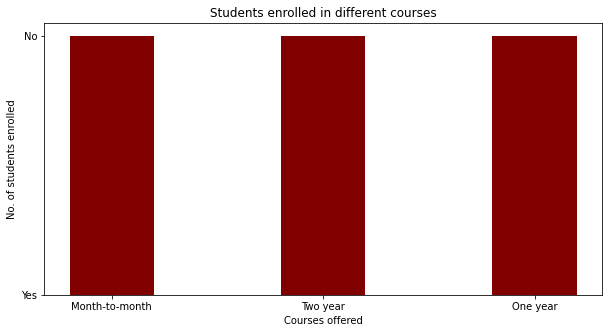

In [306]:
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(df_end['Contract'], df_end['Churn'], color ='maroon', 
        width = 0.4)
 
plt.xlabel("Courses offered")
plt.ylabel("No. of students enrolled")
plt.title("Students enrolled in different courses")
plt.show()

In [309]:
prop_by_independent = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
prop_by_independent

Churn,No,Yes
Age,,
19,85.826772,14.173228
20,76.377953,23.622047
21,74.285714,25.714286
22,79.230769,20.769231
23,80.136986,19.863014
...,...,...
76,57.971014,42.028986
77,59.722222,40.277778
78,52.380952,47.619048


In [340]:
type(prop_by_independent)

pandas.core.frame.DataFrame

In [343]:
prop_by_independent.columns

Index(['No', 'Yes'], dtype='object', name='Churn')

In [344]:
prop_by_independent.index

Index([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79, 80],
      dtype='int64', name='Age')

ValueError: shape mismatch: objects cannot be broadcast to a single shape

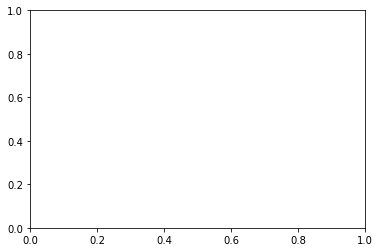

In [346]:
#plot bars in stack manner
plt.bar(prop_by_independent, prop_by_independent.Yes, color='r')
plt.bar(prop_by_independent, prop_by_independent.No, bottom=y1, color='b')
plt.show()

In [406]:
import math
#**************
def percentage_stacked_plot(columns_to_plot, super_title):
    
    '''
    Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
            Parameters:
                    columns_to_plot (list of string): Names of the variables to plot
                    super_title (string): Super title of the visualization
            Returns:
                    None
    '''
    
    number_of_columns = 2
    number_of_rows = math.ceil(len(columns_to_plot)/2)

    # create a figure
    fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
    fig.suptitle(super_title, fontsize=22,  y=.95)
 

    # loop to each column name to create a subplot
    for index, column in enumerate(columns_to_plot, 1):

        # create the subplot
        ax = plt.subplot(number_of_rows, number_of_columns, index)

        # calculate the percentage of observations of the response variable for each group of the independent variable
        # 100% stacked bar plot
        prop_by_independent = pd.crosstab(df_end[column], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

        prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
                                 rot=0, color=['springgreen','salmon'])

#         # set the legend in the upper right corner
#         ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
#                   title='Churn', fancybox=True)

#         # set title and labels
#         ax.set_title('Proportion of observations by ' + column,
#                      fontsize=16, loc='left')

#         ax.tick_params(rotation='auto')

#         # eliminate the frame from the plot
#         spine_names = ('top', 'right', 'bottom', 'left')
#         for spine_name in spine_names:
#             ax.spines[spine_name].set_visible(False)



In [408]:
cat_cols

['Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

AttributeError: 'SubplotSpec' object has no attribute 'is_first_col'

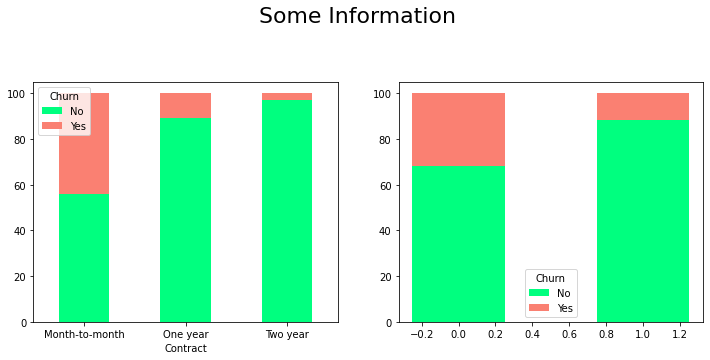

In [410]:
import matplotlib.pyplot as plt
# stacked plot of categorical columns
percentage_stacked_plot(cat_cols, 'Some Information')

In [318]:
# pip install --upgrade matplotlib

In [321]:
import matplotlib
matplotlib.__version__

'3.3.2'

In [339]:
import pandas
pandas.__version__

'2.0.3'

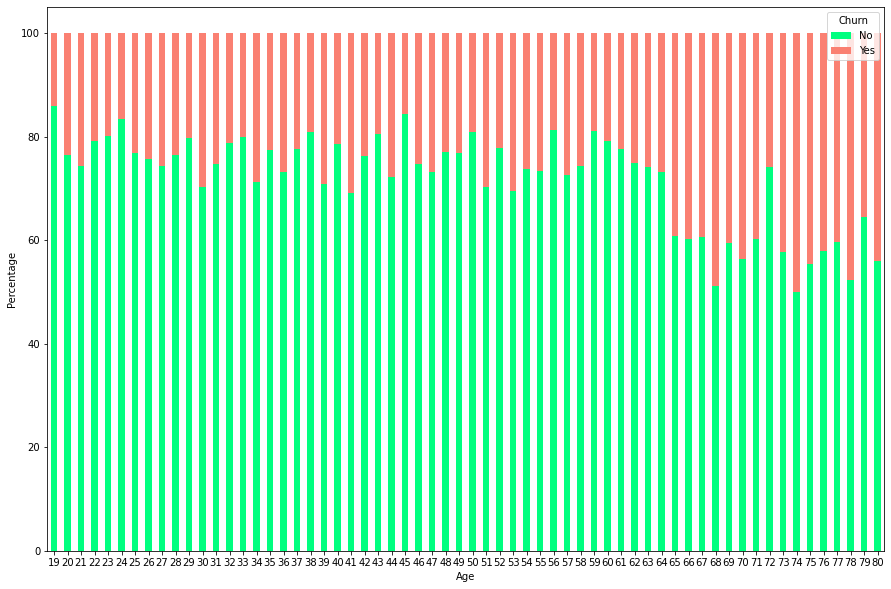

In [405]:
stacked_age = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

stacked_age.plot(figsize=(15, 10), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
plt.xlabel("Age")
plt.ylabel("Percentage")

plt.savefig("Percentage_Stacked_Age.jpg")

plt.show()


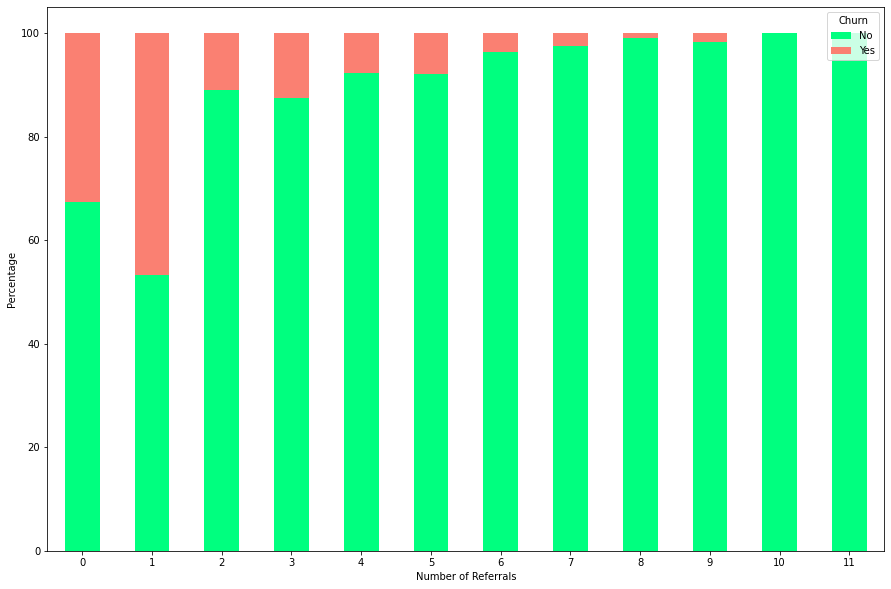

In [414]:
# fig = plt.figure(figsize=(2, 4)) 

stacked_age = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
stacked_nor = pd.crosstab(df_end['Number of Referrals'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)


# fig, axs = plt.subplots(2)
# plt.subplot(2, 1, 1)

# stacked_age.plot(figsize=(10, 6), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
# plt.xlabel("Age")
# plt.ylabel("Percentage")

# # plt.savefig("Percentage_Stacked_Age.jpg")
# plt.savefig("erdem.jpg")


# # plt.subplot(2, 1, 2)
stacked_nor.plot(figsize=(15, 10), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
plt.xlabel("Number of Referrals")
plt.ylabel("Percentage")


plt.savefig("Percentage_Stacked_NumberofReferral.jpg")
# plt.savefig("NOR.jpg")

plt.show()
 

In [411]:
cat_cols

['Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

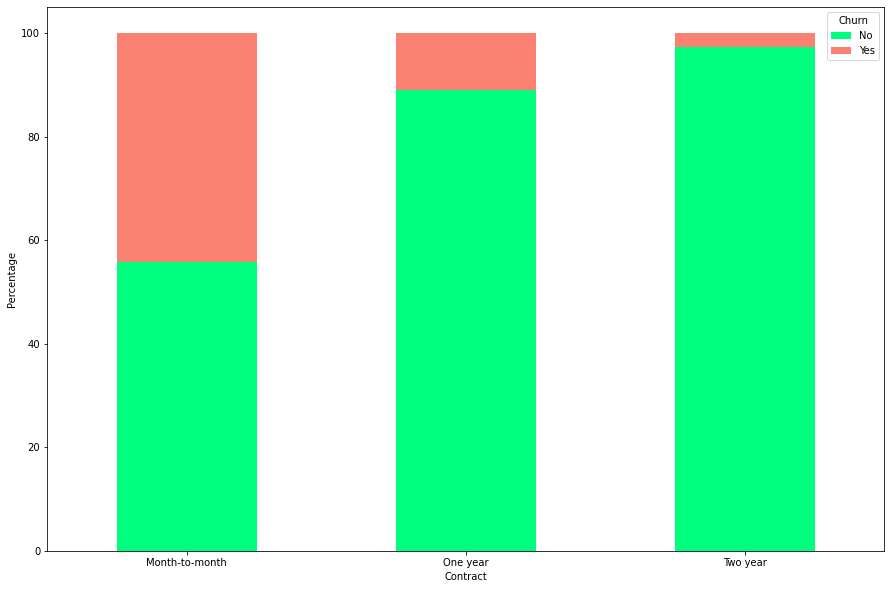

In [415]:
stacked_age = pd.crosstab(df_end['Contract'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)

stacked_age.plot(figsize=(15, 10), kind='bar', stacked=True, rot=0, color=['springgreen','salmon'])
plt.xlabel("Contract")
plt.ylabel("Percentage")

plt.savefig("Percentage_Stacked_Contract.pdf")

plt.show()

In [416]:
prop_by_independent

Churn,No,Yes
Number of Referrals,,
0,67.416907,32.583093
1,53.314917,46.685083
2,88.983051,11.016949
3,87.450980,12.549020
4,92.372881,7.627119
5,92.045455,7.954545
6,96.380090,3.619910
7,97.580645,2.419355
8,99.061033,0.938967


In [432]:
# agg_tips = tips.groupby(['day', 'sex'])['tip'].sum().unstack().fillna(0)

# prop_by_independent = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
# prop_by_independent

In [431]:
agg_tips = df_end.groupby(['Number of Referrals','Churn'])['Contract'].sum().unstack().fillna(0)
agg_tips

Churn,No,Yes
Number of Referrals,,
0,Month-to-monthOne yearOne yearMonth-to-monthMo...,Month-to-monthMonth-to-monthMonth-to-monthMont...
1,Month-to-monthTwo yearMonth-to-monthMonth-to-m...,Month-to-monthMonth-to-monthMonth-to-monthMont...
2,One yearOne yearTwo yearTwo yearTwo yearOne ye...,Month-to-monthMonth-to-monthMonth-to-monthMont...
3,Month-to-monthTwo yearOne yearMonth-to-monthOn...,Month-to-monthMonth-to-monthMonth-to-monthMont...
4,Two yearOne yearMonth-to-monthOne yearMonth-to...,Two yearMonth-to-monthMonth-to-monthMonth-to-m...
5,One yearTwo yearMonth-to-monthTwo yearMonth-to...,Month-to-monthOne yearMonth-to-monthMonth-to-m...
6,One yearOne yearMonth-to-monthOne yearTwo year...,Month-to-monthMonth-to-monthMonth-to-monthMont...
7,One yearTwo yearTwo yearTwo yearTwo yearTwo ye...,Month-to-monthMonth-to-monthOne yearMonth-to-m...
8,Two yearOne yearOne yearTwo yearOne yearTwo ye...,Month-to-monthMonth-to-monthMonth-to-monthMont...


In [436]:
num_cols

['Age', 'Number of Referrals']

In [433]:
age_churn = pd.crosstab(df_end['Age'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
age_churn

Churn,No,Yes
Age,,
19,85.826772,14.173228
20,76.377953,23.622047
21,74.285714,25.714286
22,79.230769,20.769231
23,80.136986,19.863014
...,...,...
76,57.971014,42.028986
77,59.722222,40.277778
78,52.380952,47.619048


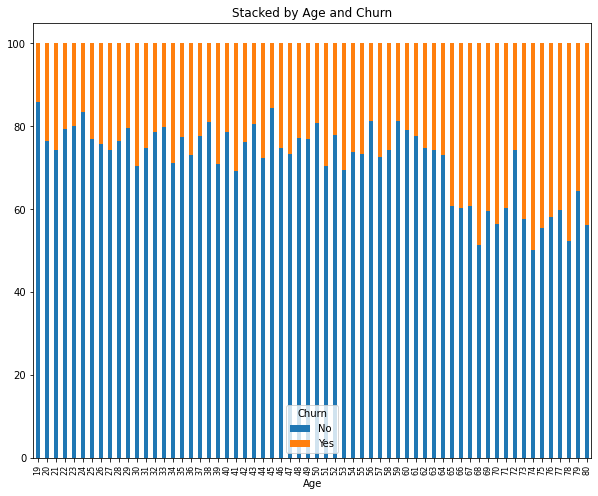

In [513]:
age_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Age and Churn')
plt.xticks(rotation=90, fontsize=8)
# plt.xticks(rotation=90, ha='center', fontsize=8)
plt.savefig("Stacked_Age&Churn.jpg")

plt.show()

In [434]:
nor_churn = pd.crosstab(df_end['Number of Referrals'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
nor_churn

Churn,No,Yes
Number of Referrals,,
0,67.416907,32.583093
1,53.314917,46.685083
2,88.983051,11.016949
3,87.450980,12.549020
4,92.372881,7.627119
5,92.045455,7.954545
6,96.380090,3.619910
7,97.580645,2.419355
8,99.061033,0.938967


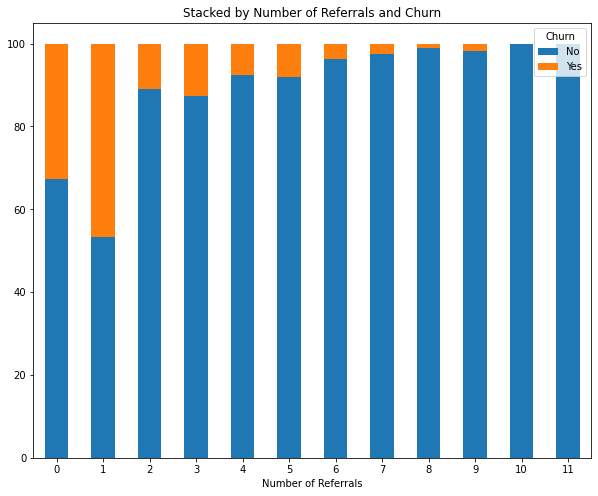

In [514]:
nor_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Number of Referrals and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Number of Referrals&Churn.jpg")

plt.show()

In [437]:
cat_cols

['Contract',
 'Dependents',
 'Married',
 'Premium Tech Support',
 'Referred a Friend']

In [435]:
con_churn = pd.crosstab(df_end['Contract'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
con_churn

Churn,No,Yes
Contract,,
Month-to-month,55.778223,44.221777
One year,89.017532,10.982468
Two year,97.316937,2.683063


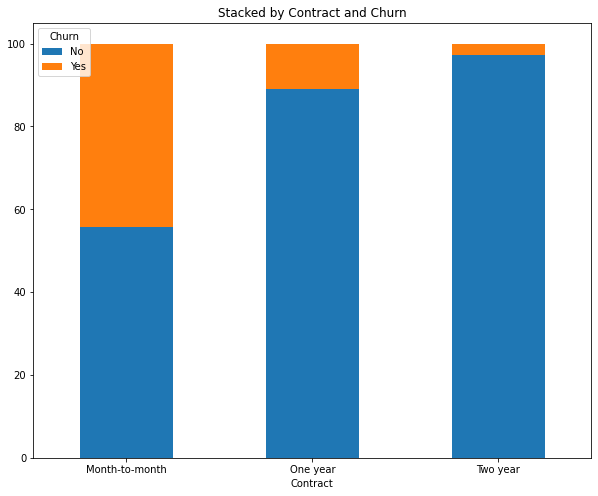

In [515]:
con_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Contract and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Contract&Churn.jpg")

plt.show()

In [438]:
dep_churn = pd.crosstab(df_end['Dependents'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
dep_churn

Churn,No,Yes
Dependents,,
No,68.054885,31.945115
Yes,88.439925,11.560075


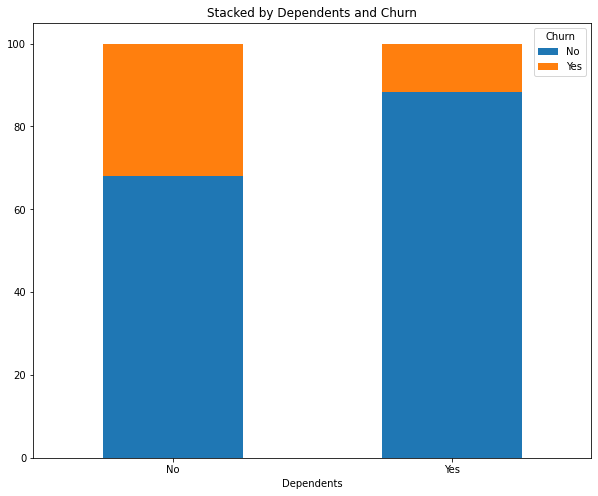

In [516]:
dep_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Dependents and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Dependents&Churn.jpg")

plt.show()

In [439]:
mar_churn = pd.crosstab(df_end['Married'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
mar_churn

Churn,No,Yes
Married,,
No,67.042021,32.957979
Yes,80.335097,19.664903


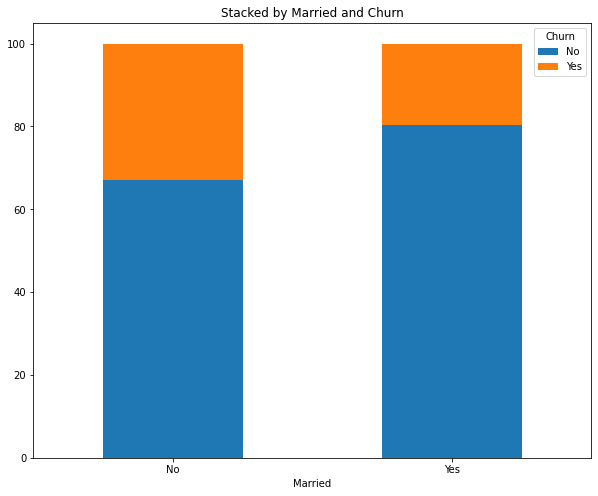

In [517]:
mar_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Married and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Married&Churn.jpg")

plt.show()

In [440]:
pre_churn = pd.crosstab(df_end['Premium Tech Support'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
pre_churn

Churn,No,Yes
Premium Tech Support,,
No,68.813763,31.186237
Yes,84.833659,15.166341


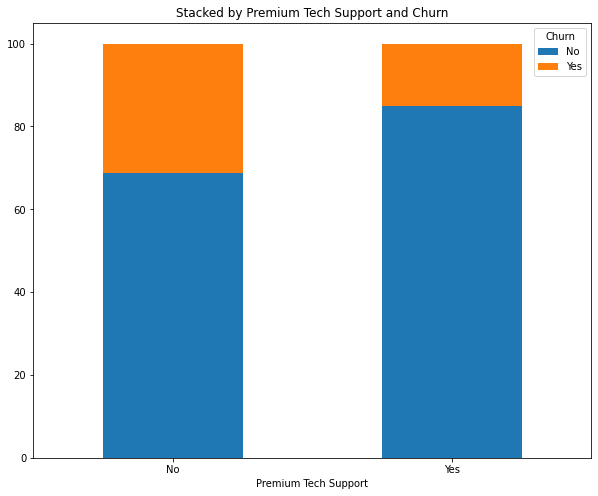

In [519]:
pre_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Premium Tech Support and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Premium Tech Support&Churn.jpg")

plt.show()

In [441]:
ref_churn = pd.crosstab(df_end['Referred a Friend'], df_end['Churn']).apply(lambda x: x/x.sum()*100, axis=1)
ref_churn

Churn,No,Yes
Referred a Friend,,
No,67.416907,32.583093
Yes,80.633147,19.366853


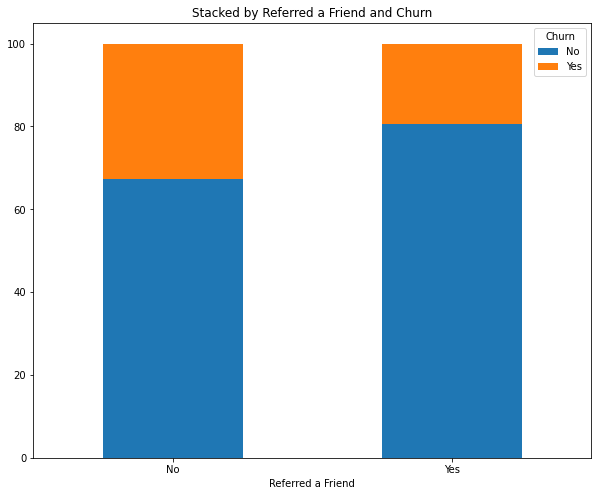

In [585]:
ref_churn.plot(figsize=(10, 8), kind='bar', stacked=True)

plt.title('Stacked by Referred a Friend and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Referred a Friend&Churn.jpg")

plt.show()

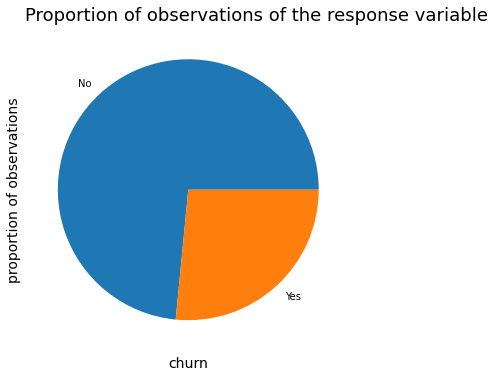

In [536]:
# create a figure
fig = plt.figure(figsize=(10, 6)) 
ax = fig.add_subplot(111)

# proportion of observation of each class
prop_response = df_end['Churn'].value_counts(normalize=True)

# create a bar plot showing the percentage of churn
# prop_response.plot(kind='bar', 
#                    ax=ax,
#                    color=['springgreen','salmon'])

prop_response.plot(kind='pie', 
                   ax=ax)

# set title and labels
ax.set_title('Proportion of observations of the response variable',
             fontsize=18, loc='left')
ax.set_xlabel('churn',
              fontsize=14)
ax.set_ylabel('proportion of observations',
              fontsize=14)
ax.tick_params(rotation='auto')

# eliminate the frame from the plot
spine_names = ('top', 'right', 'bottom', 'left')
for spine_name in spine_names:
    ax.spines[spine_name].set_visible(False)

In [547]:
# # Import libraries
# import numpy as np
# import matplotlib.pyplot as plt
 
 
# # Creating dataset
# cars = df_end['Churn'].value_counts(normalize=True)
# data = df_end['Churn'].value_counts(normalize=True)
 
 
# # Creating explode data
# explode = df_end['Churn'].value_counts(normalize=True)
 
# # Creating color parameters
# colors = ( "orange", "cyan", "brown",
#           "grey", "indigo", "beige")
 
# # Wedge properties
# wp = { 'linewidth' : 1, 'edgecolor' : "green" }
 
# # Creating autocpt arguments
# def func(pct, allvalues):
#     absolute = int(pct / 100.*np.sum(allvalues))
#     return "{:.1f}%\n({:d} g)".format(pct, absolute)
 
# # Creating plot
# fig, ax = plt.subplots(figsize =(10, 7))
# wedges, texts, autotexts = ax.pie(data, 
#                                   autopct = lambda pct: func(pct, data),
#                                   explode = explode, 
#                                   labels = cars,
#                                   shadow = True,
#                                   colors = colors,
#                                   startangle = 90,
#                                   wedgeprops = wp,
#                                   textprops = dict(color ="magenta"))
 
# # Adding legend
# ax.legend(wedges, cars,
#           title ="Churn Rates",
#           loc ="center left",
#           bbox_to_anchor =(1, 0, 0.5, 1))
 
# plt.setp(autotexts, size = 8, weight ="bold")
# ax.set_title("Normalized Stacked Pie-Chart")
 
# # show plot
# plt.show()

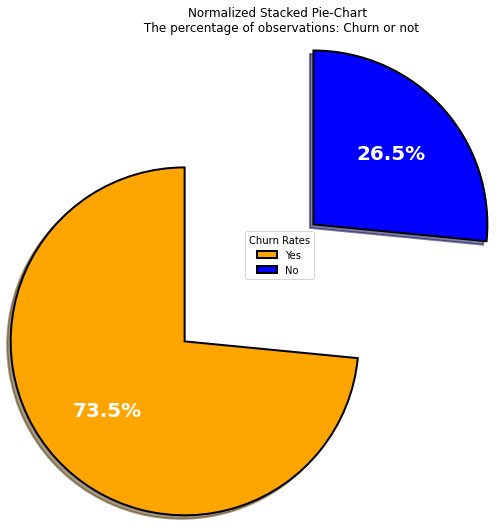

In [600]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset
cars = ['Yes', 'No']
data = df_end['Churn'].value_counts(normalize=True)
 
 
# Creating explode data
# explode = df_end['Churn'].value_counts(normalize=True)
 
# Creating color parameters
colors = ( "orange", "blue")
 
# Wedge properties
wp = { 'linewidth' : 2, 'edgecolor' : "black" }
 
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%".format(pct, absolute)
 
# Creating plot
fig, ax = plt.subplots(figsize =(10, 8))
wedges, texts, autotexts = ax.pie(data, 
                                  autopct = lambda pct: func(pct, data),
                                  explode = explode,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="white"))
 
# Adding legend
ax.legend(wedges, cars,
          title ="Churn Rates",
          loc ="center"),
#           bbox_to_anchor =(1, 0, 0.5, 1))
 
plt.setp(autotexts, size = 20, weight ="bold")
ax.set_title("Normalized Stacked Pie-Chart \n The percentage of observations: Churn or not")

plt.savefig("Normalized Stacked Pie-Chart&Churn.jpg")
 
# show plot
plt.show()

In [527]:
sennik = df_end['Age']

In [528]:
erdem = df_end['Churn']

In [520]:
ref_churn.plot(figsize=(10, 8), kind='pie', stacked=True)

plt.title('Stacked by Referred a Friend and Churn')
plt.xticks(rotation=0, fontsize=10)
# plt.xticks(rotation=90, ha='center', fontsize=8)

plt.savefig("Stacked_Referred a Friend&Churn.jpg")

plt.show()

ValueError: pie requires either y column or 'subplots=True'

AttributeError: 'SubplotSpec' object has no attribute 'is_first_col'

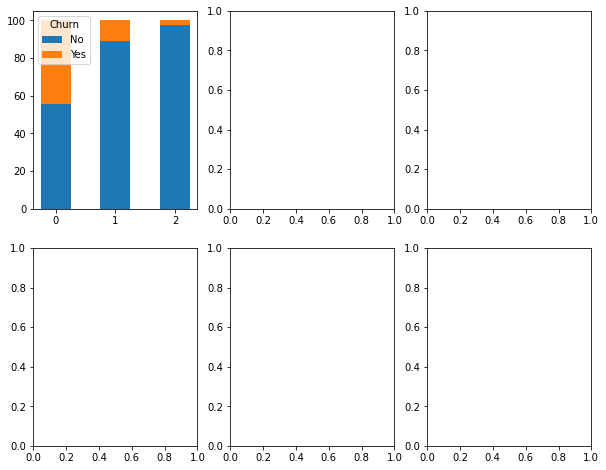

In [474]:
fig, axes = plt.subplots(nrows=2, ncols=3)

con_churn.plot(ax = axes[0,0], figsize=(10, 8), kind='bar', stacked=True)
dep_churn.plot(ax = axes[0,1], figsize=(10, 8), kind='bar', stacked=True)
# mar_churn.plot(ax = axes[0,2], figsize=(10, 8), kind='bar', stacked=True)
# pre_churn.plot(ax = axes[1,0], figsize=(10, 8), kind='bar', stacked=True)
# ref_churn.plot(ax = axes[1,1], figsize=(10, 8), kind='bar', stacked=True)

plt.show()



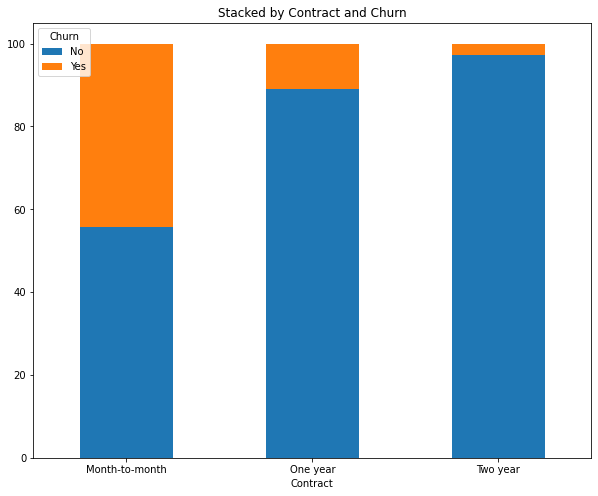

In [512]:
con_churn.plot(figsize=(10, 8), kind='bar', stacked=True)
plt.title('Stacked by Contract and Churn')
plt.xticks(rotation=0, fontsize=10)

plt.savefig("Stacked_ConChurn.jpg")

plt.show()

In [481]:
import numpy
numpy. __version__

'1.20.3'

In [482]:
import pandas
pandas. __version__

'2.0.3'

In [483]:
import matplotlib
matplotlib. __version__

'3.3.2'

NameError: name 'hue_norm' is not defined

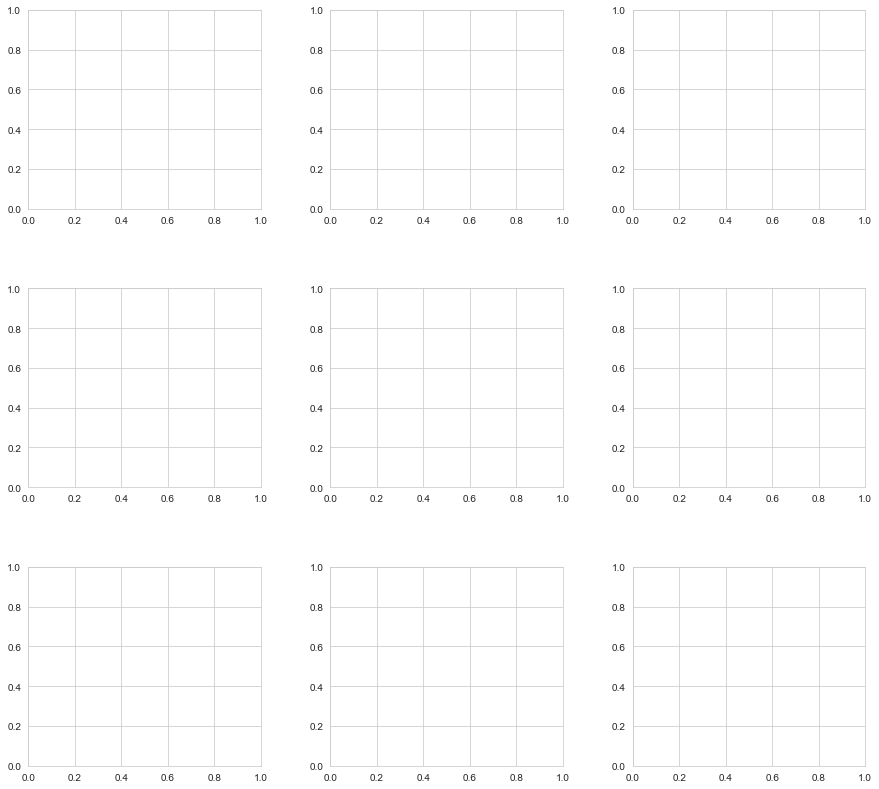

In [640]:
fig, ax = plt.subplots(3, 3, figsize=(15, 12))
plt.subplots_adjust(left=None, bottom=None, right=None, top=1, wspace=0.3, hspace=0.4)
for variable, subplot in zip(df_end.columns, ax.flatten()):
  sns.histplot(df_end[variable], hue_norm=='Churn', ax=subplot)

In [591]:
# # Divide the columns into 2 categories, one for ordinal encoding and one for one hot encoding

# from sklearn.preprocessing import OneHotEncoder

# columns_to_encode_2 = ['Payment Method', 'Contract', 'Internet Service']

# # Subset the DataFrame with the columns to encode
# data_to_encode = df_encoded[columns_to_encode_2]

# # Initialize OneHotEncoder
# encoder = OneHotEncoder(sparse=False, drop='first')

# # Fit and transform the data
# encoded_data = encoder.fit_transform(data_to_encode)

# # Create new column names for the encoded columns
# encoded_columns = encoder.get_feature_names_out(input_features=columns_to_encode_2)

# # Create a DataFrame from the encoded data
# encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns, index=data_to_encode.index)

# # Drop the original columns from df_encoded and concatenate the encoded columns
# df_encoded.drop(columns_to_encode_2, axis=1, inplace=True)
# df_encoded = pd.concat([df_encoded, encoded_df], axis=1)

In [590]:
# plt.figure(figsize=(15,8))
# df_end.corr()['Churn'].sort_values(ascending = False).plot(kind='bar')

In [599]:
X_train

,Age,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
5173,50,0,0,0,0,0,0
798,41,0,0,0,0,0,0
3261,60,1,2,1,1,1,1
1802,36,1,0,1,1,0,1
5461,45,0,0,0,0,0,0
...,...,...,...,...,...,...,...
4489,61,2,2,0,1,0,1
5426,77,5,1,0,1,0,1
565,70,0,1,0,0,0,0
4213,23,0,0,0,0,0,0


In [601]:
# !pip install imblearn

In [602]:
!pip install -U imbalanced-learn

  Using cached imbalanced_learn-0.11.0-py3-none-any.whl (235 kB)


In [648]:
from imblearn.over_sampling import SMOTE

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

In [605]:
from imblearn import under_sampling, over_sampling

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

In [606]:
from imblearn.over_sampling import BorderlineSMOTE

# Instantiate BorderlineSMOTE
borderline_smote = BorderlineSMOTE(random_state=42, kind = 'borderline-2')

# Print shapes before applying BorderlineSMOTE
print("Shapes before BorderlineSMOTE:")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

# Apply BorderlineSMOTE only on the training data
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train, y_train)

# Print shapes after applying BorderlineSMOTE
print("\nShapes after BorderlineSMOTE:")
print(f"X_train_balanced shape: {X_train_balanced.shape}")
print(f"y_train_balanced shape: {y_train_balanced.shape}")

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

C:\Users\esennik\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ValueError: Multi-dimensional indexing (e.g. `obj[:, None]`) is no longer supported. Convert to a numpy array before indexing instead.

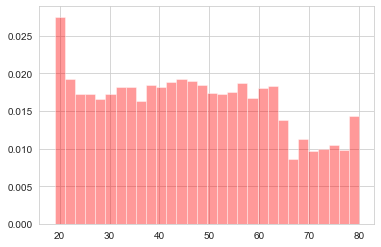

In [634]:
import seaborn as sns
sns.set_style('whitegrid')
sns.distplot(df_end['Age'], kde = True, color ='red', bins = 30)

plt.show()

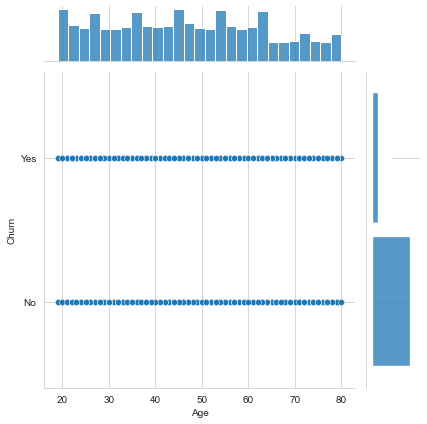

In [614]:
sns.jointplot(x ='Age', y ='Churn', data = df_end)

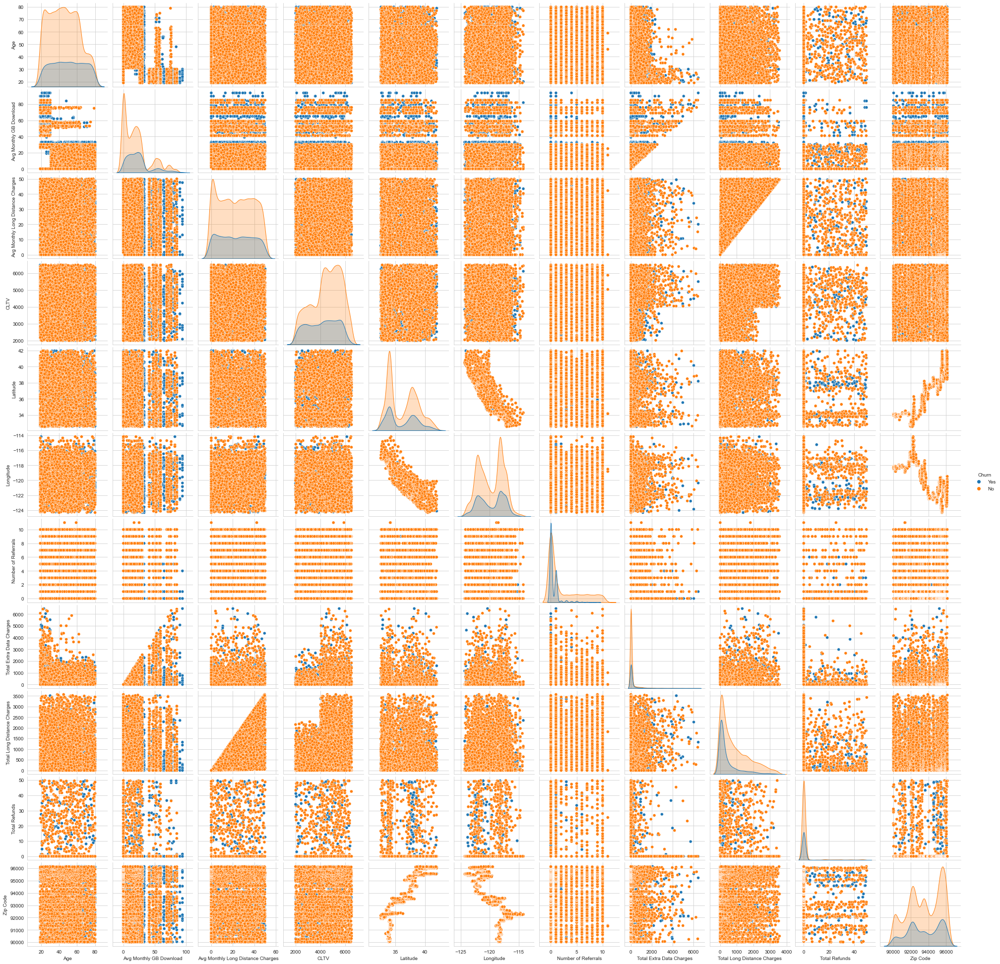

In [641]:
sns.pairplot(data = df_telco, hue='Churn')
plt.show()

In [619]:
# # Categorical-numerical variables
# fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))
# ## Are churned customers likely to get charged more?plt.subplot(1,3,1)
# sns.boxplot(df_end['Churn'], df_end['Age'])
# plt.title('Age vs Churn')
# ## When do customers churn?
# plt.subplot(1,3,2)
# sns.boxplot(df_end['Churn'], df_end['Age'])
# plt.title('Tenure vs Churn')
# ## Are senior citizen more likely to churn?
# plt.subplot(1,3,3)
# counts = (df_end.groupby(['Churn'])['Married']
#   .value_counts(normalize=True)
#   .rename('percentage')
#   .mul(100)
#   .reset_index())
# plot = sns.barplot(x="Married", y="percentage", hue="Churn", data=counts).set_title('Married vs Churn')


# plt.show()

ValueError: Could not interpret input 'Number of Referrals'

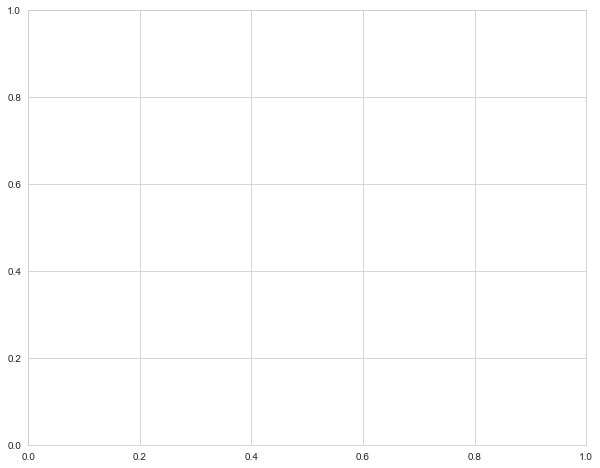

In [633]:
# Categorical-numerical variables
fig, axes = plt.subplots(figsize=(10, 8))
## Are churned customers likely to get charged more?plt.subplot(1,3,1)
# sns.boxplot(df_end['Churn'], df_end['Age'])
plot = sns.barplot(x="Churn", y="Number of Referrals", hue="Churn", data=counts).set_title('Age vs Churn')
plt.title('Age vs Churn')
plt.legend('Churn')


plt.show()

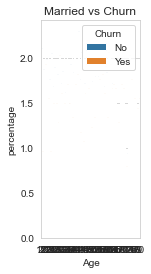

In [628]:
## Are senior citizen more likely to churn?
plt.subplot(1,3,3)
counts = (df_end.groupby(['Churn'])['Age']
  .value_counts(normalize=True)
  .rename('percentage')
  .mul(100)
  .reset_index())
plot = sns.barplot(x="Age", y="percentage", hue="Churn", data=counts).set_title('Age vs Churn')


plt.show()

### Deal with imbalanced data by doing below

In [646]:
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.model_selection import cross_val_score
# # define model
# mdl1 = RandomForestClassifier()
# # evaluate pipeline
# # cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# scores = cross_val_score(mdl1, X, y, scoring='roc_auc', n_jobs=-1)

In [647]:
...
# define pipeline
steps = [('over', SMOTE()), ('model', DecisionTreeClassifier())]
pipeline = Pipeline(steps=steps)

NameError: name 'SMOTE' is not defined

In [649]:
from imblearn.over_sampling import SMOTENC

ImportError: cannot import name '_OneToOneFeatureMixin' from 'sklearn.base' (C:\Users\esennik\Anaconda3\lib\site-packages\sklearn\base.py)

In [ ]:
from imblearn.over_sampling import SMOTENC

smote = SMOTENC(categorical_features=(x_train.dtypes == "category").values,
                random_state=42)

x_train, y_train = smote.fit_resample(x_train, y_train)

x_train_cat, y_train_cat = smote.fit_resample(x_train_cat, y_train_cat)

In [651]:
!pip install imbalanced-learn

In [653]:
# # check version number
# import imblearn

In [656]:
# check version number
import sklearn
print(sklearn.__version__)

0.23.2


In [660]:
df_end['Churn'].value_counts()

Churn
No     10348
Yes     3738
Name: count, dtype: int64

C:\Users\esennik\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn', ylabel='count'>

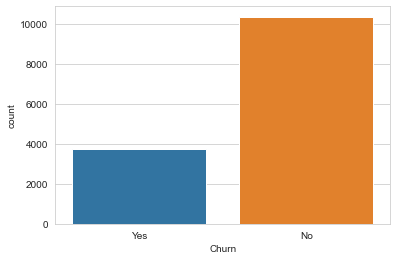

In [661]:
sns.countplot(df_end['Churn'])

In [662]:
from sklearn.utils import resample

In [663]:
df_majority = df_end[(df_end['Churn'] == 'No')]
df_minority = df_end[(df_end['Churn'] == 'Yes')]

In [673]:
df_minority_upsampled = resample(df_minority, replace = True, n_samples = 10348, random_state = 42)#, replace=True, n_sample=10348, random_state=42)
df_upsampled = pd.concat([df_minority_upsampled, df_majority])

In [674]:
df_upsampled['Churn'].value_counts()

Churn
Yes    10348
No     10348
Name: count, dtype: int64

C:\Users\esennik\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn', ylabel='count'>

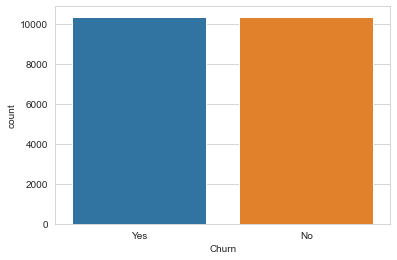

In [675]:
sns.countplot(df_upsampled['Churn'])

In [676]:
df_upsampled.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
1971,42,0,Yes,Month-to-month,No,No,No,No
2304,46,0,Yes,Month-to-month,No,No,No,No
860,53,0,Yes,One year,No,No,No,No
1294,20,0,Yes,Month-to-month,No,No,No,No
1130,66,0,Yes,Month-to-month,No,No,No,No


In [685]:
from sklearn.preprocessing import LabelEncoder
le_con = LabelEncoder()
le_dep = LabelEncoder()
le_mar = LabelEncoder()
le_pre = LabelEncoder()
le_ref = LabelEncoder()


In [686]:
df_upsampled_transformed = df_upsampled.copy()

df_upsampled_transformed['Contract'] = le_cat.fit_transform(df_upsampled_transformed['Contract'])
df_upsampled_transformed['Dependents'] = le_cat.fit_transform(df_upsampled_transformed['Dependents'])
df_upsampled_transformed['Married'] = le_cat.fit_transform(df_upsampled_transformed['Married'])
df_upsampled_transformed['Premium Tech Support'] = le_cat.fit_transform(df_upsampled_transformed['Premium Tech Support'])
df_upsampled_transformed['Referred a Friend'] = le_cat.fit_transform(df_upsampled_transformed['Referred a Friend'])

df_upsampled_transformed.head()

,Age,Number of Referrals,Churn,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
1971,42,0,Yes,0,0,0,0,0
2304,46,0,Yes,0,0,0,0,0
860,53,0,Yes,1,0,0,0,0
1294,20,0,Yes,0,0,0,0,0
1130,66,0,Yes,0,0,0,0,0


In [689]:
# select independent variables
X1 = df_upsampled_transformed.drop(columns='Churn')

# select dependent variables
y1 = df_upsampled_transformed.loc[:, 'Churn']


In [690]:
X1.head()

,Age,Number of Referrals,Contract,Dependents,Married,Premium Tech Support,Referred a Friend
1971,42,0,0,0,0,0,0
2304,46,0,0,0,0,0,0
860,53,0,1,0,0,0,0
1294,20,0,0,0,0,0,0
1130,66,0,0,0,0,0,0


In [691]:
y1.head()

1971    Yes
2304    Yes
860     Yes
1294    Yes
1130    Yes
Name: Churn, dtype: object

In [681]:
# from sklearn.model_selection import train_test_split

# # # split the data in training and testing sets
# # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
# #                                                     random_state=40, shuffle=True)
# # from sklearn.model_selection import train_test_split
# 
# # # split the data in training and testing sets
# # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40, shuffle=True)
# #   

In [692]:
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
def create_models(seed=2):
    '''
    Create a list of machine learning models.
            Parameters:
                    seed (integer): random seed of the models
            Returns:
                    models (list): list containing the models
    '''

    models = []
    models.append(('dummy_classifier', DummyClassifier(random_state=seed, strategy='most_frequent')))
    models.append(('k_nearest_neighbors', KNeighborsClassifier()))
#     models.append(('logistic_regression', LogisticRegression(random_state=seed)))
    models.append(('support_vector_machines', SVC(random_state=seed)))
    models.append(('random_forest', RandomForestClassifier(random_state=seed)))
    models.append(('gradient_boosting', GradientBoostingClassifier(random_state=seed)))
    
    return models

# create a list with all the algorithms we are going to assess
models = create_models()



In [693]:
from sklearn.metrics import accuracy_score

###
# test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # fit the model with the training data
    model.fit(X1, y1)
    # make predictions with the testing data
    predictions = model.predict(X1)
    # calculate accuracy 
    accuracy = accuracy_score(y1, predictions)
    # append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # print classifier accuracy
    print('Classifier: {}, Accuracy: {})'.format(name, accuracy))

###

Classifier: dummy_classifier, Accuracy: 0.5)
Classifier: k_nearest_neighbors, Accuracy: 0.8103981445689988)
Classifier: support_vector_machines, Accuracy: 0.7625144955546965)
Classifier: random_forest, Accuracy: 0.8465887127947429)
Classifier: gradient_boosting, Accuracy: 0.7901043679938152)


In [ ]:
Classifier: dummy_classifier, Accuracy: 0.7346301292063041)
Classifier: k_nearest_neighbors, Accuracy: 0.8027829050120687)
Classifier: support_vector_machines, Accuracy: 0.756282834019594)
Classifier: random_forest, Accuracy: 0.8343035638222348)
Classifier: gradient_boosting, Accuracy: 0.7939798381371574)

In [707]:
matplotlib.__version__

'3.3.2'

In [708]:
pandas.__version__

'2.0.3'

In [709]:
numpy.__version__

'1.20.3'

In [711]:
import seaborn
seaborn.__version__

'0.11.0'

In [713]:
import streamlit
streamlit.__version__

'1.29.0'

In [714]:
import sklearn
sklearn.__version__

'0.23.2'

In [716]:
import math


In [718]:
matplotlib.__version__

'3.3.2'

In [719]:
!pip list command

Package                            Version
---------------------------------- -------------------
alabaster                          0.7.12
altair                             4.2.0
anaconda-client                    1.7.2
anaconda-navigator                 1.10.0
anaconda-project                   0.8.3
anyio                              3.5.0
AnyQt                              0.1.1
argh                               0.26.2
argon2-cffi                        20.1.0
asn1crypto                         1.4.0
astroid                            2.4.2
astropy                            4.0.2
async-generator                    1.10
atomicwrites                       1.4.0
attrs                              20.3.0
Automat                            22.10.0
autopep8                           1.5.4
aws                                0.2.5
Babel                              2.8.1
backcall                           0.2.0
backports.functools-lru-cache      1.6.4
backports.shutil-get-terminal-size 

In [ ]:
scikit-learn                       1.3.2
pandas                             2.0.3
numpy                              1.20.3
streamlit                          1.29.0

In [723]:
!pip install scikit-learn == 1.2.2 --user

ERROR: Invalid requirement: '=='
